In [1]:
#check Graphic card details
!nvidia-smi

Tue Dec  1 03:11:20 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.38       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Module 1 (Pose detection)**
In this module we detect does image have full pose shots of humans.


## Pose Detection with HRNet

This Module was developed  using an open source project [lxy5513/hrnet](https://github.com/lxy5513/hrnet) to detect/track multi person poses on a given youtube video. The original HRNet code was [here](https://github.com/leoxiaobin/deep-high-resolution-net.pytorch).


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Install Hrnet

In [ ]:
#you can directlty run below step it is just to save download time
!cp -r '/content/drive/My Drive/AAIC/CS2/hrnet' '/content/'


In [ ]:
#impor libaries and git repos needed for this module

import os
import shutil
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/lxy5513/hrnet.git'
project_name = splitext(basename(git_repo_url))[0]
!pip install -q youtube-dl EasyDict==1.7 Cython pyyaml json_tricks scikit-image yacs>=0.1.5 ipdb
!cd {project_name}/lib && make
if not exists(project_name):
  # clone and install dependencies
  !git clone -q {git_repo_url}
  #!cd {project_name} && pip install -q -r requirements.txt
  !pip install -q youtube-dl EasyDict==1.7 Cython pyyaml json_tricks scikit-image yacs>=0.1.5 ipdb
  !cd {project_name}/lib && make
  
import sys
sys.path.append(project_name)
sys.path.append(join(project_name, 'tools'))
sys.path.append(join(project_name, 'lib'))
import time
import matplotlib
import matplotlib.pylab as plt
plt.rcParams["axes.grid"] = False

from IPython.display import YouTubeVideo

cd nms; python setup_linux.py build_ext --inplace; rm -rf build; cd ../../
running build_ext
skipping 'cpu_nms.c' Cython extension (up-to-date)
cythoning gpu_nms.pyx to gpu_nms.cpp
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/hrnet/lib/nms/gpu_nms.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'gpu_nms' extension
creating build
creating build/temp.linux-x86_64-3.6
/usr/local/cuda/bin/nvcc -I/usr/local/lib/python3.6/dist-packages/numpy/core/include -I/usr/local/cuda/include -I/usr/include/python3.6m -c nms_kernel.cu -o build/temp.linux-x86_64-3.6/nms_kernel.o -arch=sm_35 --ptxas-options=-v -c --compiler-options '-fPIC'
ptxas info    : 0 bytes gmem
ptxas info    : Compiling entry function '_Z10nms_kernelifPKfPy' for 'sm_35'
ptxas info    : Function properties for _Z10nms_kernelifPKfPy
    0 bytes stack frame, 0 bytes

In [ ]:
#copy required weights, pre-trained models
def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}
  

pretrained_model_parent_directory = 'models/pytorch/pose_coco'
pretrained_model_path = join(project_name, pretrained_model_parent_directory, 'pose_hrnet_w48_256x192.pth')
if not exists(pretrained_model_path):
  # download the pretrained model
  !rm -rf {project_name}/models
  !mkdir -p {project_name}/{pretrained_model_parent_directory}
  download_from_google_drive('15T2XqPjW7Ex0uyC1miGVYUv7ULOxIyJI', pretrained_model_path)
  
yolo_pretrained_model_path = join(project_name, 'lib/detector/yolo/yolov3.weights')
if not exists(yolo_pretrained_model_path):
  # download the YOLO weights
  !cd {project_name}/lib/detector/yolo/ && wget -q https://pjreddie.com/media/files/yolov3.weights

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   408    0   408    0     0   3487      0 --:--:-- --:--:-- --:--:--  3487
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  243M    0  243M    0     0   155M      0 --:--:--  0:00:01 --:--:--  289M


In [ ]:
# load hrnet and YOLO model
import cv2
import numpy as np
from utilitys import plot_keypoint, PreProcess
from lib.core.inference import get_final_preds
import torch
import config
import models
from config import cfg, update_config
from types import SimpleNamespace
from google.colab.patches import cv2_imshow

from lib.detector.yolo.human_detector import human_bbox_get as yolo_det
from lib.detector.yolo.human_detector import load_model as yolo_model


update_config(cfg,
              SimpleNamespace(cfg = join(project_name, 'experiments/coco/hrnet/w48_256x192_adam_lr1e-3.yaml'),
                              opts = '',
                              modelDir='', logDir='', dataDir='', prevModelDir=''))

def model_load(config):
  model = models.pose_hrnet.get_pose_net(config, is_train=False)
  #model_file_name  = join(project_name, 'models/pytorch/pose_coco/pose_hrnet_w48_256x192.pth')
  model_file_name  = join(project_name, 'models/pytorch/pose_coco/pose_hrnet_w48_256x192.pth')
  state_dict = torch.load(model_file_name)
  from collections import OrderedDict
  new_state_dict = OrderedDict()
  for k, v in state_dict.items():
      name = k # remove module.
      #  print(name,'\t')
      new_state_dict[name] = v
  model.load_state_dict(new_state_dict)
  model.eval()
  return model
  
pose_model = model_load(cfg).cuda()


human_model = yolo_model()

Loading network.....
Network successfully loaded


In [ ]:
"""

keypoints= [ "nose", #0
            "left_eye",1
            "right_eye",2 
            "left_ear", 3
            "right_ear",4
            "left_shoulder",   5
            "right_shoulder",6
            "left_elbow", 7
            "right_elbow",8
            "left_wrist", 9
            "right_wrist",10
            "left_hip", 11
            "right_hip", 12
            "left_knee", 13
            "right_knee",14
            "left_ankle", 15
            "right_ankle" ]16

"""

In [ ]:
#function to detect full pose image

def detect_pose(pa,c):

  image = pa
  frame = cv2.imread(image, cv2.IMREAD_COLOR | cv2.IMREAD_IGNORE_ORIENTATION)
  bboxs, scores = yolo_det(frame, human_model)
  src_dir = pa 
  if len(bboxs)>0:
    inputs, origin_img, center, scale = PreProcess(frame, bboxs, scores, cfg)

    with torch.no_grad():
      # compute output heatmap
      inputs = inputs[:,[2,1,0]]
      output = pose_model(inputs.cuda())
      #print(output.shape)
      # compute coordinate
      preds, maxvals = get_final_preds(
          cfg, output.clone().cpu().numpy(), np.asarray(center), np.asarray(scale))
      thresh = 0.7
      if maxvals[0][0]>thresh and maxvals[0][1]>thresh and maxvals[0][2]>thresh and maxvals[0][3]>thresh and maxvals[0][4]>thresh and maxvals[0][13]>thresh and maxvals[0][14]>thresh and maxvals[0][15]>thresh and maxvals[0][16]>thresh:
        #dst_dir = '/content/full_shot' + '/' + f'image_{c}' + '.jpg' --uncomment when you want to move all full shot to single folder
        #shutil.copy(src_dir,dst_dir)
        return 1
      else:
        return 0
        
  else:
    return 0

  

In [ ]:
#sample test images
li = ['/content/image2_0.jpg',
      '/content/image2_1.jpg',
      '/content/image2_2.jpg',
      '/content/image2_3.jpg',
      '/content/image3_0.jpg',
      '/content/image3_1.jpg',
      '/content/image3_2.jpg',
      '/content/image3_3.jpg']

/content/image2_0.jpg
Not a Full Pose Image


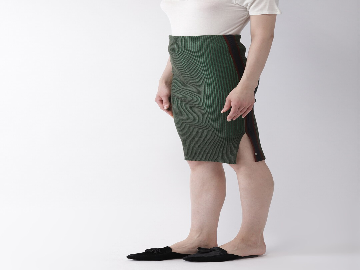



/content/image2_1.jpg
Not a Full Pose Image


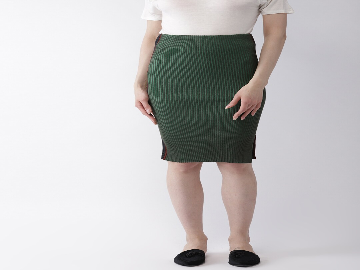



/content/image2_2.jpg
Not a Full Pose Image


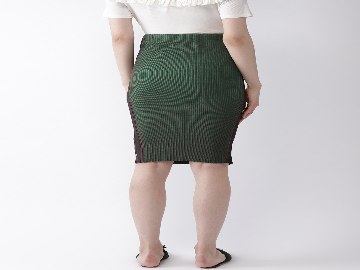



/content/image2_3.jpg
Full Pose Image


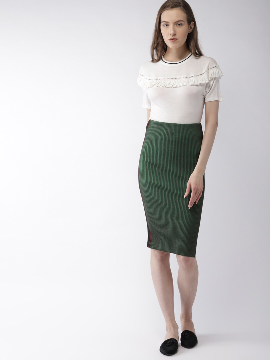



/content/image3_0.jpg
Not a Full Pose Image


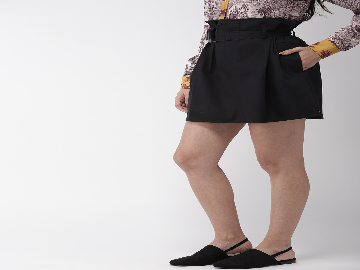



/content/image3_1.jpg
Not a Full Pose Image


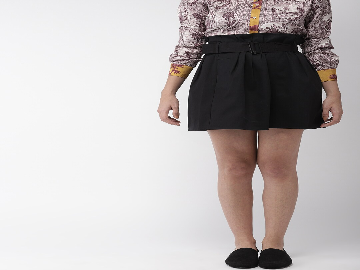



/content/image3_2.jpg
Not a Full Pose Image


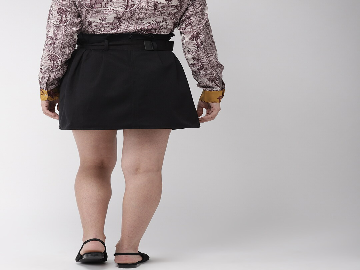



/content/image3_3.jpg
Full Pose Image


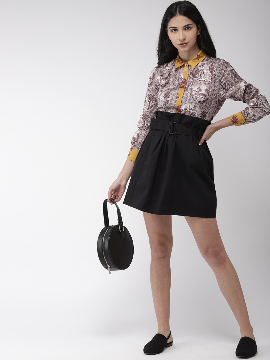

In [ ]:
for i in li:
  print('='*50)
  print(i)
  #print('\n')
  a = detect_pose(i,0)
  if a==1:
    print("Full Pose Image")
    frame = cv2.imread(i, cv2.IMREAD_COLOR | cv2.IMREAD_IGNORE_ORIENTATION)
    frame = cv2.resize(frame,(270,360))
    cv2_imshow(frame)
    print('='*50)
    print('\n')
  if a==0:
    print("Not a Full Pose Image")
    frame = cv2.imread(i, cv2.IMREAD_COLOR | cv2.IMREAD_IGNORE_ORIENTATION)
    frame = cv2.resize(frame,(360,270))
    cv2_imshow(frame)
    print('='*50)
    print('\n')



In [ ]:
'''
Image that are detected as full pose images will be passed to second object localization module training.
'''

# **Module 2 (Fashion Objects localiztion)**
In this module we use object detection techniques to localizalize fashion objects in the images 

In [ ]:
"""
To avoid reduntant code I will just paste the sample results of models I tried before I finalised the Mask RCNN for object detction module

"""

In [ ]:
"""
So I have trained models using Tensorflow object detection api 2.0. For doing this I have refferd following site
https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/
I trained models like 
1:CenterNet HourGlass104 512x512
2:EfficientDet D0 512x512
3:Faster R-CNN ResNet50 V1 640x640
4:YOLO V3
"""

"""
Training details:
Step 1:
First  I fine tuned trained models using Deep Fashion database it has bounding boxes for (Upper_ware, Lower_ware and full_ware)
this data set has almost 200000 labelled box images
Link to dataset:
https://s3-eu-west-1.amazonaws.com/valohai-examples/deep-fashion-detection/category-and-attribute-prediction-benchmark-v1.1.zip

Step 2:
I fined tuned the above model on my custom dataset which I had scraped from myntra. This dataset had bounding boxes for 
(upper_ware,lower ware and foot_ware) It had almost 2k labelled images

Observation:
As my fine tunnig dataset was very small and above dataset had only 1  object per image. So the above model didn't perform well
when there were multiple objects. MAP for model was also very low. So I couldn't use this model.

Below is one example of prediction
"""

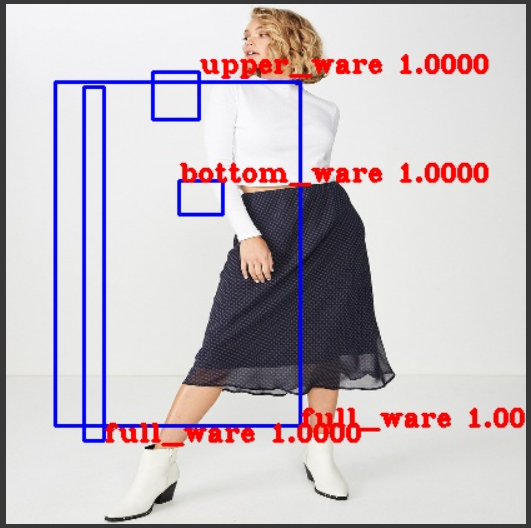

In [ ]:
"""
As the above approach didn't work. From bounding box I went for a masking approach. I have used Mask-RCNN model.
I have used iMaterialist (Fashion) dataset. Details of this dataset can be found on Kaggle

Link: https://www.kaggle.com/c/imaterialist-fashion-2019-FGVC6/data

For training I have refered the kernel: https://www.kaggle.com/pednoi/training-mask-r-cnn-to-be-a-fashionista-lb-0-07
"""

In [ ]:
# Download data from kaggle iMaterialist (Fashion) 2019 at FGVC6.
# https://www.kaggle.com/c/imaterialist-fashion-2019-FGVC6/data

In [ ]:
import os
import gc
import sys
import json
import glob
import random
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import itertools
from tqdm import tqdm

from imgaug import augmenters as iaa
from sklearn.model_selection import StratifiedKFold, KFold

In [ ]:
DATA_DIR = Path('/kaggle/input')
ROOT_DIR = Path('/kaggle/working')

# For demonstration purpose, the classification ignores attributes (only categories),
# and the image size is set to 512, which is the same as the size of submission masks
NUM_CATS = 46
IMAGE_SIZE = 512

Dowload Libraries and Pretrained Weights for Mask RCNN model

In [ ]:
!git clone https://www.github.com/matterport/Mask_RCNN.git
os.chdir('Mask_RCNN')

!rm -rf .git # to prevent an error when the kernel is committed
!rm -rf images assets # to prevent displaying images at the bottom of a kernel

In [ ]:
!cp '/content/drive/MyDrive/AAIC/CS2/models/mask_rcnn_fashion_0006.h5' '/content/Mask_RCNN'
!cp '/content/drive/MyDrive/AAIC/CS2/models/label_descriptions.json' '/content/' 

In [ ]:
# Root directory of the project
ROOT_DIR = os.getcwd()

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library

custom_WEIGHTS_PATH = '/content/Mask_RCNN/mask_rcnn_fashion_0006.h5'

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

In [ ]:

from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

In [ ]:
# !wget --quiet https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5
# !ls -lh mask_rcnn_coco.h5

COCO_WEIGHTS_PATH = 'mask_rcnn_coco.h5'

In [ ]:
class FashionConfig(Config):
    NAME = "fashion"
    NUM_CLASSES = NUM_CATS + 1 # +1 for the background class
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 4 # a memory error occurs when IMAGES_PER_GPU is too high
    
    BACKBONE = 'resnet50'
    
    IMAGE_MIN_DIM = IMAGE_SIZE
    IMAGE_MAX_DIM = IMAGE_SIZE    
    IMAGE_RESIZE_MODE = 'none'
    
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    #DETECTION_NMS_THRESHOLD = 0.0
    
    # STEPS_PER_EPOCH should be the number of instances 
    # divided by (GPU_COUNT*IMAGES_PER_GPU), and so should VALIDATION_STEPS;
    # however, due to the time limit, I set them so that this kernel can be run in 9 hours
    STEPS_PER_EPOCH = 1000
    VALIDATION_STEPS = 200
    
config = FashionConfig()
config.display()

In [ ]:

#load model and weights
model = modellib.MaskRCNN(mode='training', config=config, model_dir=ROOT_DIR)

model.load_weights(custom_WEIGHTS_PATH, by_name=True, exclude=[
    'mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_bbox', 'mrcnn_mask'])

In [ ]:
with open(DATA_DIR/"label_descriptions.json") as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]

In [ ]:
segment_df = pd.read_csv(DATA_DIR/"train.csv")

multilabel_percent = len(segment_df[segment_df['ClassId'].str.contains('_')])/len(segment_df)*100
print(f"Segments that have attributes: {multilabel_percent:.2f}%")

"""
Segments that contain attributes are only 3.46% of data, and according to the host, 
80% of images have no attribute. So, in the first step, we can only deal with categories to reduce the complexity of the task.


"""

In [ ]:
segment_df['CategoryId'] = segment_df['ClassId'].str.split('_').str[0]

print("Total segments: ", len(segment_df))
segment_df.head()

In [ ]:
image_df = segment_df.groupby('ImageId')['EncodedPixels', 'CategoryId'].agg(lambda x: list(x))
size_df = segment_df.groupby('ImageId')['Height', 'Width'].mean()
image_df = image_df.join(size_df, on='ImageId')

print("Total images: ", len(image_df))
image_df.head()

In [ ]:
def resize_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_AREA)  
    return img

In [ ]:
class FashionDataset(utils.Dataset):

    def __init__(self, df):
        super().__init__(self)
        
        # Add classes
        for i, name in enumerate(label_names):
            self.add_class("fashion", i+1, name)
        
        # Add images 
        for i, row in df.iterrows():
            self.add_image("fashion", 
                           image_id=row.name, 
                           path=str(DATA_DIR/'train'/row.name), 
                           labels=row['CategoryId'],
                           annotations=row['EncodedPixels'], 
                           height=row['Height'], width=row['Width'])

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path'], [label_names[int(x)] for x in info['labels']]
    
    def load_image(self, image_id):
        return resize_image(self.image_info[image_id]['path'])

    def load_mask(self, image_id):
        info = self.image_info[image_id]
                
        mask = np.zeros((IMAGE_SIZE, IMAGE_SIZE, len(info['annotations'])), dtype=np.uint8)
        labels = []
        
        for m, (annotation, label) in enumerate(zip(info['annotations'], info['labels'])):
            sub_mask = np.full(info['height']*info['width'], 0, dtype=np.uint8)
            annotation = [int(x) for x in annotation.split(' ')]
            
            for i, start_pixel in enumerate(annotation[::2]):
                sub_mask[start_pixel: start_pixel+annotation[2*i+1]] = 1

            sub_mask = sub_mask.reshape((info['height'], info['width']), order='F')
            sub_mask = cv2.resize(sub_mask, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_NEAREST)
            
            mask[:, :, m] = sub_mask
            labels.append(int(label)+1)
            
        return mask, np.array(labels)

In [ ]:
dataset = FashionDataset(image_df)
dataset.prepare()

for i in range(6):
    image_id = random.choice(dataset.image_ids)
    print(dataset.image_reference(image_id))
    
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names, limit=4)

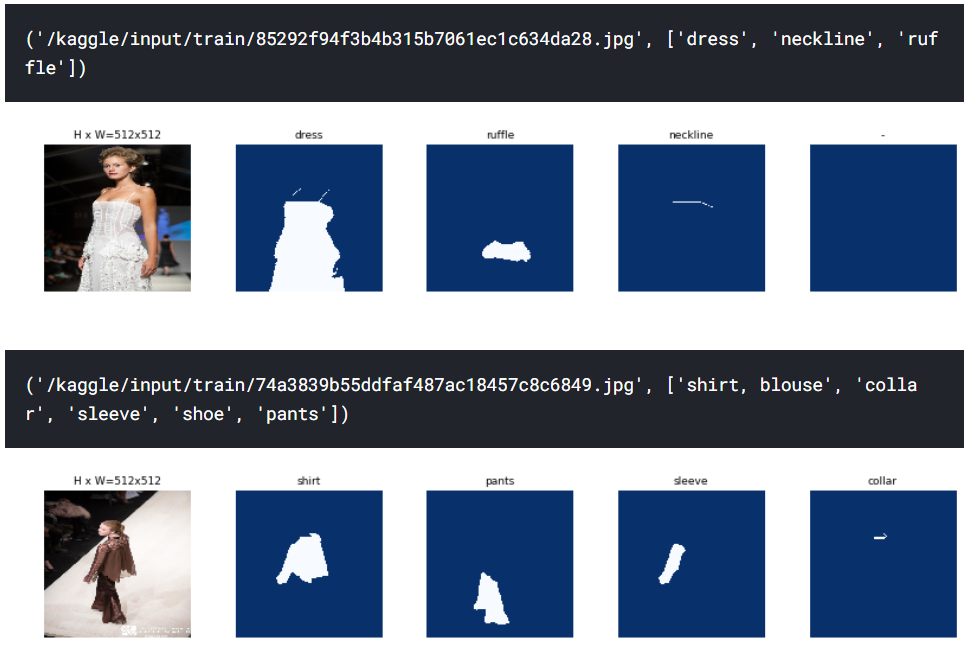

In [ ]:
# This code partially supports k-fold training, 
# you can specify the fold to train and the total number of folds here
FOLD = 0
N_FOLDS = 5

kf = KFold(n_splits=N_FOLDS, random_state=42, shuffle=True)
splits = kf.split(image_df) # ideally, this should be multilabel stratification

def get_fold():    
    for i, (train_index, valid_index) in enumerate(splits):
        if i == FOLD:
            return image_df.iloc[train_index], image_df.iloc[valid_index]
        
train_df, valid_df = get_fold()

train_dataset = FashionDataset(train_df)
train_dataset.prepare()

valid_dataset = FashionDataset(valid_df)
valid_dataset.prepare()

In [ ]:
train_segments = np.concatenate(train_df['CategoryId'].values).astype(int)
print("Total train images: ", len(train_df))
print("Total train segments: ", len(train_segments))

plt.figure(figsize=(12, 3))
values, counts = np.unique(train_segments, return_counts=True)
plt.bar(values, counts)
plt.xticks(values, label_names, rotation='vertical')
plt.show()

valid_segments = np.concatenate(valid_df['CategoryId'].values).astype(int)
print("Total train images: ", len(valid_df))
print("Total validation segments: ", len(valid_segments))

plt.figure(figsize=(12, 3))
values, counts = np.unique(valid_segments, return_counts=True)
plt.bar(values, counts)
plt.xticks(values, label_names, rotation='vertical')
plt.show()

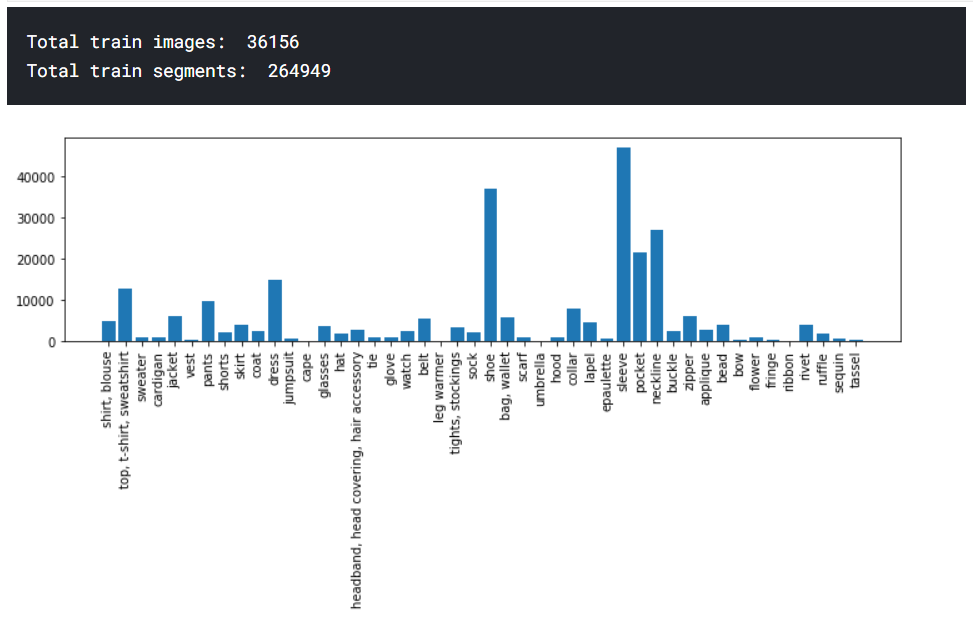

Train

In [ ]:
!wget https://storage.googleapis.com/cs2_myntra_bucket/mask_rcnn_fashion_0007.h5

In [ ]:
COCO_WEIGHTS_PATH = 'mask_rcnn_fashion_0007.h5'

In [ ]:
# Note that any hyperparameters here, such as LR, may still not be optimal
LR = 1e-4
EPOCHS = [2, 6, 8]

import warnings 
warnings.filterwarnings("ignore")

In [ ]:
model = modellib.MaskRCNN(mode='training', config=config, model_dir=ROOT_DIR)

model.load_weights(COCO_WEIGHTS_PATH, by_name=True, exclude=[
    'mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_bbox', 'mrcnn_mask'])

In [ ]:
augmentation = iaa.Sequential([
    iaa.Fliplr(0.5) # only horizontal flip here
])

In [ ]:
%%time
model.train(train_dataset, valid_dataset,
            learning_rate=LR*3, # train heads with higher lr to speedup learning
            epochs=EPOCHS[0],
            layers='heads',
            augmentation=None)

history = model.keras_model.history.history

In [ ]:
%%time
model.train(train_dataset, valid_dataset,
            learning_rate=LR,
            epochs=EPOCHS[1],
            layers='all',
            augmentation=augmentation)

new_history = model.keras_model.history.history
for k in new_history: history[k] = history[k] + new_history[k]

In [ ]:
%%time
model.train(train_dataset, valid_dataset,
            learning_rate=LR/5,
            epochs=EPOCHS[2],
            layers='all',
            augmentation=augmentation)

new_history = model.keras_model.history.history
for k in new_history: history[k] = history[k] + new_history[k]

In [ ]:
epochs = range(EPOCHS[-1])

plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.plot(epochs, history['loss'], label="train loss")
plt.plot(epochs, history['val_loss'], label="valid loss")
plt.legend()
plt.subplot(132)
plt.plot(epochs, history['mrcnn_class_loss'], label="train class loss")
plt.plot(epochs, history['val_mrcnn_class_loss'], label="valid class loss")
plt.legend()
plt.subplot(133)
plt.plot(epochs, history['mrcnn_mask_loss'], label="train mask loss")
plt.plot(epochs, history['val_mrcnn_mask_loss'], label="valid mask loss")
plt.legend()

plt.show()

In [ ]:
best_epoch = np.argmin(history["val_loss"]) + 1
print("Best epoch: ", best_epoch)
print("Valid loss: ", history["val_loss"][best_epoch-1])

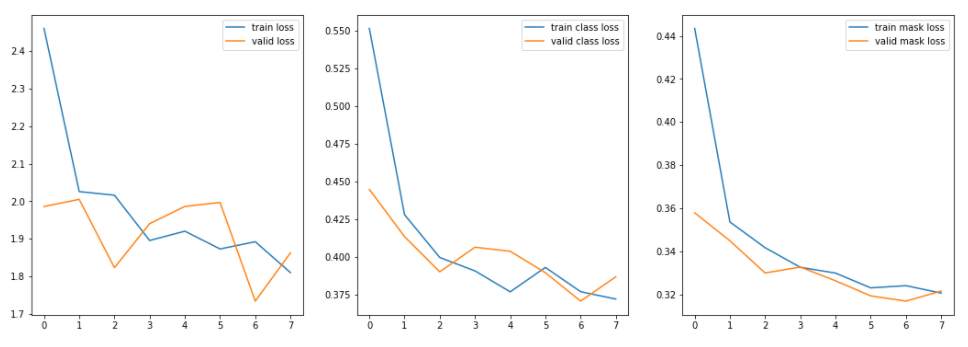

Predict

In [ ]:
# We should be able to directly predict using saved model so I am again importing all modules

!pip install tensorflow==1.9.0
!pip install keras==2.2.0

In [57]:
import os
import gc
import sys
import json
import glob
import random
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import itertools
from tqdm import tqdm

from imgaug import augmenters as iaa
from sklearn.model_selection import StratifiedKFold, KFold

In [58]:
# For demonstration purpose, the classification ignores attributes (only categories),
# and the image size is set to 512, which is the same as the size of submission masks
NUM_CATS = 46
IMAGE_SIZE = 512

In [59]:
!git clone https://www.github.com/matterport/Mask_RCNN.git


Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 40.39 MiB/s, done.
Resolving deltas: 100% (560/560), done.


In [60]:
os.chdir('Mask_RCNN')

!rm -rf .git # to prevent an error when the kernel is committed
!rm -rf images assets # to prevent displaying images at the bottom of a kernel

In [61]:
#copy saved model that is trained in above steps
!cp '/content/drive/MyDrive/AAIC/CS2/models/mask_rcnn_fashion_0006.h5' '/content/Mask_RCNN'
!cp '/content/drive/MyDrive/AAIC/CS2/models/label_descriptions.json' '/content/' 

In [62]:
# Root directory of the project
ROOT_DIR = os.getcwd()

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library

custom_WEIGHTS_PATH = '/content/Mask_RCNN/mask_rcnn_fashion_0006.h5'

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

In [63]:
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or 

In [64]:
class FashionConfig(Config):
    NAME = "fashion"
    NUM_CLASSES = NUM_CATS + 1 # +1 for the background class
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 4 # a memory error occurs when IMAGES_PER_GPU is too high
    
    BACKBONE = 'resnet50'
    
    IMAGE_MIN_DIM = IMAGE_SIZE
    IMAGE_MAX_DIM = IMAGE_SIZE    
    IMAGE_RESIZE_MODE = 'none'
    
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    #DETECTION_NMS_THRESHOLD = 0.0
    
    # STEPS_PER_EPOCH should be the number of instances 
    # divided by (GPU_COUNT*IMAGES_PER_GPU), and so should VALIDATION_STEPS;
    # however, due to the time limit, I set them so that this kernel can be run in 9 hours
    STEPS_PER_EPOCH = 1000
    VALIDATION_STEPS = 200
    
config = FashionConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     4
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 4
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                59
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              none
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                

In [65]:
class InferenceConfig(FashionConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

model = modellib.MaskRCNN(mode='inference', 
                          config=inference_config,
                          model_dir=ROOT_DIR)

model_path ='/content/Mask_RCNN/mask_rcnn_fashion_0006.h5'
assert model_path != '', "Provide path to trained weights"


print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  /content/Mask_RCNN/mask_rcnn_fashion_0006.h5


In [66]:
li = ['/content/image4_3.jpg']

/content/image4_3.jpg


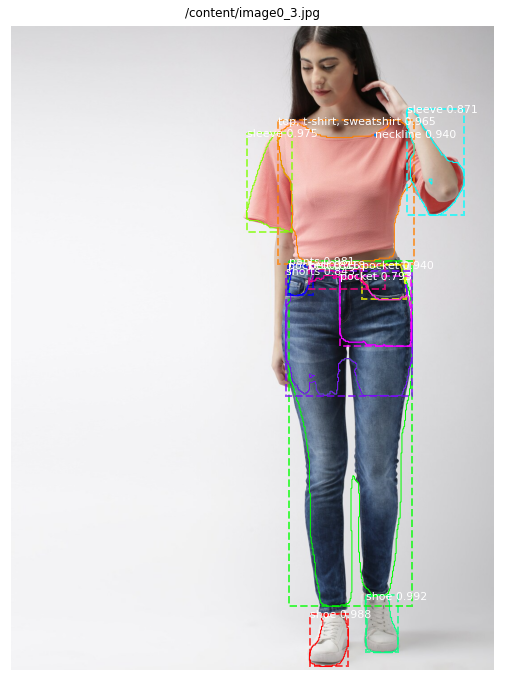

In [67]:
def resize_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_AREA)  
    return img

# Since the submission system does not permit overlapped masks, we have to fix them
def refine_masks(masks, rois):
    areas = np.sum(masks.reshape(-1, masks.shape[-1]), axis=0)
    mask_index = np.argsort(areas)
    union_mask = np.zeros(masks.shape[:-1], dtype=bool)
    for m in mask_index:
        masks[:, :, m] = np.logical_and(masks[:, :, m], np.logical_not(union_mask))
        union_mask = np.logical_or(masks[:, :, m], union_mask)
    for m in range(masks.shape[-1]):
        mask_pos = np.where(masks[:, :, m]==True)
        if np.any(mask_pos):
            y1, x1 = np.min(mask_pos, axis=1)
            y2, x2 = np.max(mask_pos, axis=1)
            rois[m, :] = [y1, x1, y2, x2]
    return masks, rois

with open('/content/label_descriptions.json') as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]  
for i in li:
    print(i)
    image_id = '/content/image0_3.jpg'
    image_path = i
    
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    result = model.detect([resize_image(image_path)])
    r = result[0]
    
    if r['masks'].size > 0:
        masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
        for m in range(r['masks'].shape[-1]):
            masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
        y_scale = img.shape[0]/IMAGE_SIZE
        x_scale = img.shape[1]/IMAGE_SIZE
        rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
        masks, rois = refine_masks(masks, rois)
    else:
        masks, rois = r['masks'], r['rois']
        
    visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12),show_mask=False)

In [69]:
import os
import sys
import random
import itertools
import colorsys

import numpy as np
from skimage.measure import find_contours
import matplotlib.pyplot as plt
from matplotlib import patches,  lines
from matplotlib.patches import Polygon
import IPython.display

from mrcnn import utils


In [70]:
#combine categories for simplification
feet = ['shoe']
upperbody = ['cardigan',
 'collar',
 'epaulette',
 'hood',
 'jacket',
 'lapel',
 'neckline',
 'shirt, blouse',
 'sleeve',
 'sweater',
 'top, t-shirt, sweatshirt',
 'vest']

lowerbody = ['pants', 'pocket', 'shorts', 'skirt']
wholebody = ['cape', 'coat', 'dress', 'jumpsuit']

In [71]:
def resize_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_AREA)  
    return img


def refine_masks(masks, rois):
    areas = np.sum(masks.reshape(-1, masks.shape[-1]), axis=0)
    mask_index = np.argsort(areas)
    union_mask = np.zeros(masks.shape[:-1], dtype=bool)
    for m in mask_index:
        masks[:, :, m] = np.logical_and(masks[:, :, m], np.logical_not(union_mask))
        union_mask = np.logical_or(masks[:, :, m], union_mask)
    for m in range(masks.shape[-1]):
        mask_pos = np.where(masks[:, :, m]==True)
        if np.any(mask_pos):
            y1, x1 = np.min(mask_pos, axis=1)
            y2, x2 = np.max(mask_pos, axis=1)
            rois[m, :] = [y1, x1, y2, x2]
    return masks, rois

with open('/content/label_descriptions.json') as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]  

In [72]:

def get_box(path):

  image_path = path
  img = cv2.imread(image_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  result = model.detect([resize_image(image_path)])
  r = result[0]

  if r['masks'].size > 0:
      masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
      for m in range(r['masks'].shape[-1]):
          masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                      (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
      
      y_scale = img.shape[0]/IMAGE_SIZE
      x_scale = img.shape[1]/IMAGE_SIZE
      rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
      
      masks, rois = refine_masks(masks, rois)
      return img, masks, rois, r
  else:
      masks, rois = r['masks'], r['rois']
      return img,masks, rois, r
  
  
      


In [73]:

#here we will get boxes for our combined category

def get_parts(image, boxes, masks, class_ids, class_names,
                      scores=None, title="",
                      figsize=(16, 16), ax=None,
                      show_mask=True, show_bbox=True,
                      colors=None, captions=None):
    """
    boxes: [num_instance, (y1, x1, y2, x2, class_id)] in image coordinates.
    masks: [height, width, num_instances]
    class_ids: [num_instances]
    class_names: list of class names of the dataset
    scores: (optional) confidence scores for each box
    title: (optional) Figure title
    show_mask, show_bbox: To show masks and bounding boxes or not
    figsize: (optional) the size of the image
    colors: (optional) An array or colors to use with each object
    captions: (optional) A list of strings to use as captions for each object
    """
    # Number of instances
    N = boxes.shape[0]
    if not N:
        print("\n*** No instances to display *** \n")
    else:
        assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

    # Show area outside image boundaries.
    height, width = image.shape[:2]
    masked_image = image.astype(np.uint32).copy()

    feet_temp = []
    upperbody_temp = []
    lowerbody_temp = []
    wholebody_temp = []

    for i in range(N):
        # Bounding box
        if not np.any(boxes[i]):
            # Skip this instance. Has no bbox. Likely lost in image cropping.
            continue
        y1, x1, y2, x2 = boxes[i]
        # Label
        if not captions:
            class_id = class_ids[i]
            score = scores[i] if scores is not None else None
            label = class_names[class_id]
            caption = "{} {:.3f}".format(label, score) if score else label
            # print(f'class id: {class_id}, score: {score}, lable: {label},caption:{caption}')
            # print(y1, x1, y2, x2)
            if score>0.70:
              if label in feet:
                feet_temp.append((y1, x1, y2, x2))
              if label in upperbody:
                upperbody_temp.append((y1, x1, y2, x2))
              if label in lowerbody:
                lowerbody_temp.append((y1, x1, y2, x2))
              if label in wholebody:
                wholebody_temp.append((y1, x1, y2, x2))
        else:
            caption = captions[i]
    
    return  feet_temp ,upperbody_temp,lowerbody_temp , wholebody_temp



In [221]:
#get only objects from the boxes
def crop(y1,x1,y2,x2,img):
  outimage = img[int(y1):int(y2), int(x1):int(x2)]
  return outimage

def get_min_max(li,no,typee):
  mini = []
  for i in li:
    mini.append(i[no])
  if typee=='min': 
    return min(mini)
  if typee=='max':
    return max(mini)

def get_crop_image(img,li,name):
  #n = len(li)
  images = []
  if name=='feet':
    for i in li:
      outimage = crop(i[0],i[1],i[2],i[3],img)
      images.append(outimage)
  if name=='full':
    for i in li:
      outimage = crop(i[0],i[1],i[2],i[3],img)
      images.append(outimage)
  if name=='upp':
    y1 = get_min_max(li,0,'min')
    x1 = get_min_max(li,1,'min')
    y2 = get_min_max(li,2,'max')
    x2 = get_min_max(li,3,'max')
    outimage = crop(y1,x1,y2,x2,img)
    images.append(outimage)

  if name=='bott':
    y1 = get_min_max(li,0,'min')
    x1 = get_min_max(li,1,'min')
    y2 = get_min_max(li,2,'max')
    x2 = get_min_max(li,3,'max')
    outimage = crop(y1,x1,y2,x2,img)
    images.append(outimage)
  return images

In [222]:
def object_detctions(path):
  img , masks, rois, r = get_box(path)
  feet_temp ,upperbody_temp,lowerbody_temp , wholebody_temp = get_parts(img, rois, masks, r['class_ids'], 
                              ['bg']+label_names, r['scores'],
                              title=path, figsize=(12, 12),show_mask=False)
  feet_images = []
  whole_images = []
  upperbody_images = []
  lowerbody_images = []
  if len(feet_temp)>0:
    feet_images = get_crop_image(img,feet_temp,'feet')
  if len(wholebody_temp)>0:
    whole_images = get_crop_image(img,wholebody_temp,'full')
  if len(upperbody_temp)>0:
    upperbody_images = get_crop_image(img,upperbody_temp,'upp')
  if len(lowerbody_temp)>0:
    lowerbody_images = get_crop_image(img,lowerbody_temp,'bott')
  
  return img , masks, rois, r , feet_images, whole_images, upperbody_images, lowerbody_images


In [223]:
path = '/content/image4_3.jpg'
img , masks, rois, r , feet_images,whole_images,upperbody_images,lowerbody_images = object_detctions(path)

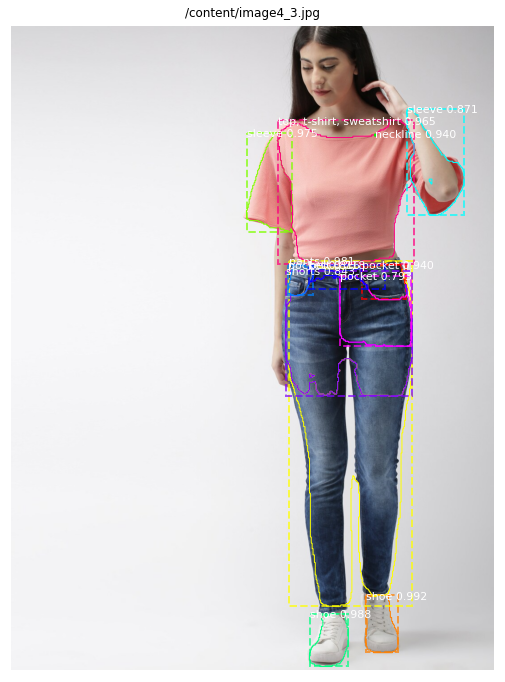

In [224]:
visualize.display_instances(img, rois, masks, r['class_ids'], 
                            ['bg']+label_names, r['scores'],
                            title=path, figsize=(12, 12),show_mask=False)

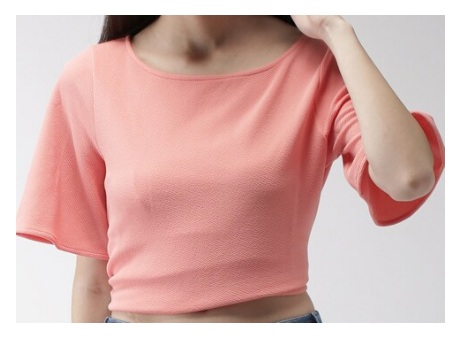

In [225]:
#crop samples that we will pass to embedding module for searching samples
for i in upperbody_images:
  outimage = i
  _, ax = plt.subplots(1, figsize=(8,8))
  auto_show = True

  height, width = outimage.shape[:2]
  ax.set_ylim(height + 10, -10)
  ax.set_xlim(-10, width + 10)
  ax.axis('off')
  img1 = outimage.astype(np.uint32).copy()
  ax.imshow(img1.astype(np.uint8))
  plt.show()

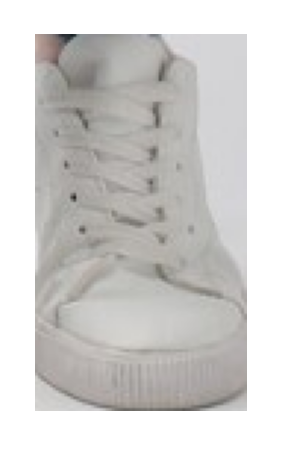

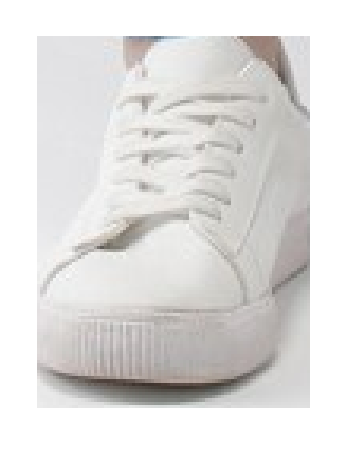

In [226]:
for i in feet_images:
  outimage = i
  _, ax = plt.subplots(1, figsize=(8,8))
  auto_show = True

  height, width = outimage.shape[:2]
  ax.set_ylim(height + 10, -10)
  ax.set_xlim(-10, width + 10)
  ax.axis('off')
  img1 = outimage.astype(np.uint32).copy()
  ax.imshow(img1.astype(np.uint8))
  plt.show()

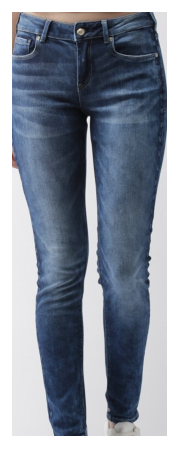

In [227]:
for i in lowerbody_images:
  outimage = i
  _, ax = plt.subplots(1, figsize=(8,8))
  auto_show = True

  height, width = outimage.shape[:2]
  ax.set_ylim(height + 10, -10)
  ax.set_xlim(-10, width + 10)
  ax.axis('off')
  img1 = outimage.astype(np.uint32).copy()
  ax.imshow(img1.astype(np.uint8))
  plt.show()

In [ ]:
"""
This crop images will be passed to module 3 to convert them to embeddings
"""

# **Module 3 (Generate embeddings of images)**
In this module we will use some pre-trained and get embeddings from their last layer

In [ ]:
"""
So I am taking pre-trained models and removing the top layer and just taking the embeddings. So before finalize 
DenseNet12 model I tried ResNet50,ResNet101, MobileNet, Iception but all models embeddings had an average sparsity of 20% to 30%
whereas DenseNet12 had only 4% average sparsity in embedding vector. 

So I choose DenseNet12 model for embedding.
"""

In [78]:
import tensorflow as tf
import datetime as dt
import cv2
import numpy as np


In [106]:
tf.keras.backend.clear_session()
model_embedding = tf.keras.applications.DenseNet121(
    include_top=False, weights='imagenet', input_tensor=None, input_shape=(520,520,3),
    pooling=None,
)
def load_img(img):

  img = cv2.imread(path,cv2.IMREAD_UNCHANGED) 
  img = cv2.resize(img,(520,520),interpolation=cv2.INTER_AREA)
  img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  img = tf.image.convert_image_dtype(img,tf.float32)[tf.newaxis, ...] 
  return img 

def get_embeddings(path):
  img = load_img(path)
  op = model_embedding.predict(img,steps=1)
  op = tf.squeeze(op, axis=None, name=None)
  op = tf.reduce_mean(op, axis=(0,1), keepdims=False, name=None)
  op = op.eval(session=tf.Session()) 
  op = op.tolist()
  return op

In [82]:
t = dt.datetime.now()
em1 = get_embeddings('/content/image4_3.jpg')
print(dt.datetime.now()-t)

0:00:04.391697


# **Module 4 (Store embeddings)**
In this module we will store all our embeddings in Elastic Search so we can easily retrive them using similarity logic


In [4]:
!pip install elasticsearch

     |████████████████████████████████| 327kB 18.0MB/s 


Get Catlog data


In [15]:
from elasticsearch import Elasticsearch
import os
import pandas as pd
import json
from elasticsearch import helpers
import os
import numpy as np

In [6]:

os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/AAIC/CS2/"

In [7]:
!kaggle datasets download -d shreyas90999/mycasestudy02ee

100% 11.1G/11.1G [04:26<00:00, 52.7MB/s]
100% 11.1G/11.1G [04:26<00:00, 44.6MB/s]


In [8]:
mkdir data

In [9]:
!unzip -q '/content/mycasestudy02ee.zip' -d '/content/data'

In [10]:
rm -rf '/content/mycasestudy02ee.zip'

In [11]:
folder = []
json_file =[]
for (root,dirs,files) in os.walk('/content/data/', topdown=False):
  for directory in dirs:
    for i in os.listdir(root+directory):
      if i.endswith('.json'):
        folder.append(directory)
        json_file.append(i)

  


In [16]:
super_cat = []
cat = []
info = []
file_name = []
url =[]
for i in range(len(json_file)):
  f = open('/content/data/' + folder[i] + '/' + json_file[i] )
  data = json.load(f)
  for j in data['name']:
    if folder[i]=='women_boots' or folder[i]=='women_casual_shoes' or folder[i]=='women_flats' or folder[i]=='women_heels':
       super_cat.append('foot_ware')
       cat.append(folder[i])
       info.append(json_file[i])
       file_name.append(j)
       url.append(data['url'])
    if folder[i]=='women_shirts_tops_tees':
      super_cat.append('upper_ware')
      cat.append(folder[i])
      info.append(json_file[i])
      file_name.append(j)
      url.append(data['url'])
    if folder[i]=='women_jeans_jeggings' or folder[i]=='women_shorts_skirts' or folder[i]=='women_trousers':
      super_cat.append('lower_ware')
      cat.append(folder[i])
      info.append(json_file[i])
      file_name.append(j)
      url.append(data['url'])
  f.close()



df = pd.DataFrame({ 'id':np.arange(len(file_name)),
                    'super_cat':super_cat,
                   'cat':cat,
                   'info':info,
                   'file_name':file_name,
                   'url':url})

In [ ]:
df.to_csv('data_myntra.csv')

In [17]:
df.head()

,id,super_cat,cat,info,file_name,url
0,0,lower_ware,women_shorts_skirts,image803.json,image803_0.jpg,https://www.myntra.com/shorts/mango/mango-wome...
1,1,lower_ware,women_shorts_skirts,image803.json,image803_1.jpg,https://www.myntra.com/shorts/mango/mango-wome...
2,2,lower_ware,women_shorts_skirts,image803.json,image803_2.jpg,https://www.myntra.com/shorts/mango/mango-wome...
3,3,lower_ware,women_shorts_skirts,image803.json,image803_3.jpg,https://www.myntra.com/shorts/mango/mango-wome...
4,4,lower_ware,women_shorts_skirts,image803.json,image803_4.jpg,https://www.myntra.com/shorts/mango/mango-wome...


Transfer data to Elastic Search instance

Guide to how setup up Elastic search on any public cloud 
Link: https://www.digitalocean.com/community/tutorials/how-to-install-and-configure-elasticsearch-on-ubuntu-18-04

In [48]:
es = Elasticsearch(['https://33892e7bc9b0435797412d466eb0c9b3.us-central1.gcp.cloud.es.io:9243'],http_auth=('elastic', 'BNNq0HD4BqipxvVsHEz3aU44'))

create_query = {
    "mappings": {
        "properties": {
            "description_vector": {
                "type": "dense_vector",
                "dims": 1024
            }
        }
    }
}
#create index
es.indices.create(index="upper_ware", body=create_query)
es.indices.create(index="foot_ware", body=create_query)
es.indices.create(index="lower_ware", body=create_query)

In [164]:
docs = []
c = 0
t = dt.datetime.now()
for row in df.iterrows():
  json_obj = {}
  path = root + row[1]['cat']+'/' + row[1]['file_name']
  em = get_embeddings(path)
  json_obj['_index']=row[1]['super_cat']
  json_obj['_id']=row[1]['id']
  json_obj['url'] = row[1]['url']
  json_obj['cat'] = row[1]['cat']
  json_obj['file_name'] = row[1]['file_name']
  json_obj['description_vector'] = em
  docs.append(json_obj)
  c+=1
  if c%5000==0:
    print(c)
    print(dt.datetime.now()-t)



In [54]:
#transfer all embeddings to Elastic Search
helpers.bulk(es, docs)

(52708, [])

Sample search query

In [153]:
#Search query


def search_similar_image(query_vec,index_label):
  search_query = {
      "size": 20,
      "_source": {
          "includes": ["file_name","url"]
      },
      "query": {
          "script_score": {
              "query": {
                  "match_all": {}
              },
              "script": {
                  #"source": "cosineSimilarity(params.queryVector, 'description_vector') + 1.0",
                  "source": "1 / l2norm(params.queryVector,'description_vector') + 1.0",
                  "params": {
                      "queryVector": query_vec
                  }
              }
          }
      }
  }
  response = es.search(
      index= index_label,
      body=search_query
  )

  return response


Final Predict Function

In [ ]:
import cv2, wget
#utility finctions

def print_recommendations(response):
  c=1
  flag = []
  def url_to_image(link):
    image_url = link
    filename = wget.download(image_url)
    img = cv2.imread(filename,cv2.IMREAD_UNCHANGED)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img


  def get_image_links(n,df):
    id = int(n)
    root = '/content/data/'
    path = root + df['cat'][id] + '/' + df['info'][id]
    f = open(path)
    data = json.load(f)
    li = data['links']
    f.close()
    return li


  def plot_images(li):
    fig, ax = plt.subplots(1,len(li), figsize=(20,20))
    for i in range(len(li)): 
      outimage = li[i]
      auto_show = True
      height, width = outimage.shape[:2]
      ax[i].set_ylim(height + 10, -10)
      ax[i].set_xlim(-10, width + 10)
      ax[i].axis('off')
      img1 = outimage.astype(np.uint32).copy()
      ax[i].imshow(img1.astype(np.uint8))
    plt.show()

  for i in response['hits']['hits']:
    url = i['_source']['url']
    id = i['_id']
    if url not in flag:
      flag.append(url)
      links = get_image_links(int(id),df)
      images = []
      for j in links:
        img = url_to_image(j)
        images.append(img)
      print(f"recomendation {c}")
      print("You can buy product from below link")
      print(url)
      print("="*200)
      plot_images(images)
      print("="*200)
      c+=1
      if c==6:
        break


In [166]:
#Final function used for prediction
def buy_me_that_look(path):
  #path = '/content/image4_3.jpg'
  # if detect_pose(pa,c)==0:
  #   print("No pose full pose")
  print("Searching for fashion objects...........")
  t = dt.datetime.now()
  img , masks, rois, r , feet_images,whole_images,upperbody_images,lowerbody_images = object_detctions(path)
  print("Time taken to locate all objects ", dt.datetime.now()-t )
  print("Below is the image with all detected fashion objects")
  print('+'*200)
  visualize.display_instances(img, rois, masks, r['class_ids'], 
                              ['bg']+label_names, r['scores'],
                              title=path, figsize=(8,8),show_mask=False)
  print('+'*200)

  if len(upperbody_images)>0:
    c=1
    index_label = 'upper_ware'
    for i in upperbody_images:
      print(f"*********Query Image {c} to find upper body clothes****************")
      outimage = i
      _, ax = plt.subplots(1, figsize=(4,4))
      auto_show = True

      height, width = outimage.shape[:2]
      ax.set_ylim(height + 10, -10)
      ax.set_xlim(-10, width + 10)
      ax.axis('off')
      img1 = outimage.astype(np.uint32).copy()
      ax.imshow(img1.astype(np.uint8))
      plt.show()    
      t = dt.datetime.now()
      query_vec = get_embeddings(i)
      print("Time taken to do embedding of image ", dt.datetime.now()-t )
      print("Searching for images....... ")
      t = dt.datetime.now()
      response = search_similar_image(query_vec,index_label)
      print("Time taken to search similar images ", dt.datetime.now()-t )
      print('='*200)
      print_recommendations(response)

  if len(lowerbody_images)>0:
    c=1
    index_label = 'lower_ware'
    for i in lowerbody_images:
      print(f"******************Query Image {c} to find lower body clothes************")
      outimage = i
      _, ax = plt.subplots(1, figsize=(4,4))
      auto_show = True

      height, width = outimage.shape[:2]
      ax.set_ylim(height + 10, -10)
      ax.set_xlim(-10, width + 10)
      ax.axis('off')
      img1 = outimage.astype(np.uint32).copy()
      ax.imshow(img1.astype(np.uint8))
      plt.show()    
      t = dt.datetime.now()
      query_vec = get_embeddings(i)
      print("Time taken to do embedding of image ", dt.datetime.now()-t )
      print("Searching for images....... ")
      t = dt.datetime.now()
      response = search_similar_image(query_vec,index_label)
      print("Time taken to search similar images ", dt.datetime.now()-t )
      print('='*200)
      print_recommendations(response)


  if len(feet_images)>0:
    c=1
    index_label = 'foot_ware'
    for i in feet_images:
      print(f"****************Query Image {c} to find lower body clothes********************")
      outimage = i
      _, ax = plt.subplots(1, figsize=(4,4))
      auto_show = True

      height, width = outimage.shape[:2]
      ax.set_ylim(height + 10, -10)
      ax.set_xlim(-10, width + 10)
      ax.axis('off')
      img1 = outimage.astype(np.uint32).copy()
      ax.imshow(img1.astype(np.uint8))
      plt.show()    
      t = dt.datetime.now()
      query_vec = get_embeddings(i)
      print("Time taken to do embedding of image ", dt.datetime.now()-t )
      print("Searching for images....... ")
      t = dt.datetime.now()
      response = search_similar_image(query_vec,index_label)
      print("Time taken to search similar images ", dt.datetime.now()-t )
      print('='*200)
      print_recommendations(response)
      


Searching for fashion objects...........
Time taken to locate all objects  0:00:07.500255
Below is the image with all detected fashion objects
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


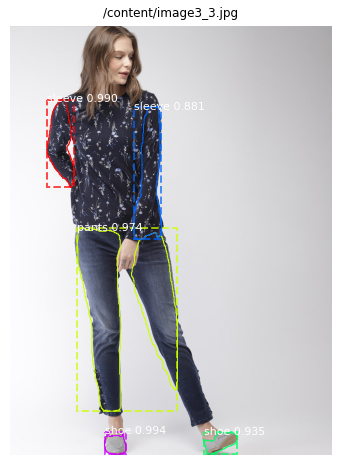

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
*********Query Image 1 to find upper body clothes****************


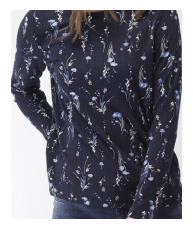

Time taken to do embedding of image  0:00:05.136109
Searching for images....... 
Time taken to search similar images  0:00:03.367982
recomendation 1
You can buy product from below link
https://www.myntra.com/tops/promod/promod-women-rust-brown-self-design-top/11722724/buy


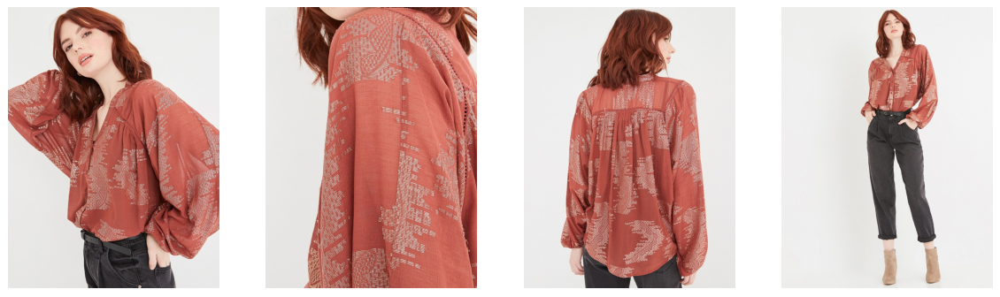

recomendation 2
You can buy product from below link
https://www.myntra.com/shirts/ovs/ovs-women-peach-coloured-regular-fit-semi-sheer-solid-casual-shirt/7560797/buy


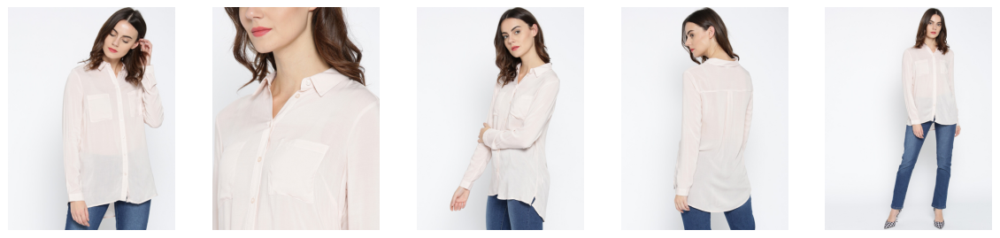

recomendation 3
You can buy product from below link
https://www.myntra.com/tops/pepe-jeans/pepe-jeans-women-mustard-yellow-self-design-top/2279350/buy


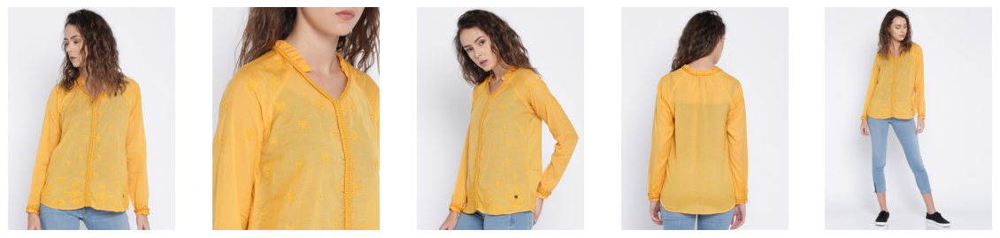

recomendation 4
You can buy product from below link
https://www.myntra.com/tops/ovs/ovs-women-navy-blue-striped-shirt-style-top/7560520/buy


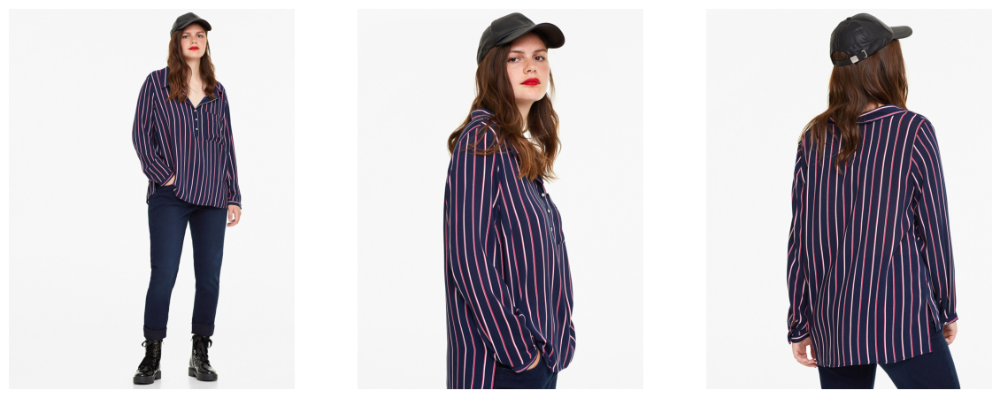

recomendation 5
You can buy product from below link
https://www.myntra.com/tops/dorothy-perkins/dorothy-perkins-women-blue--pink-floral-print-cinched-waist-victorian-top/12126106/buy


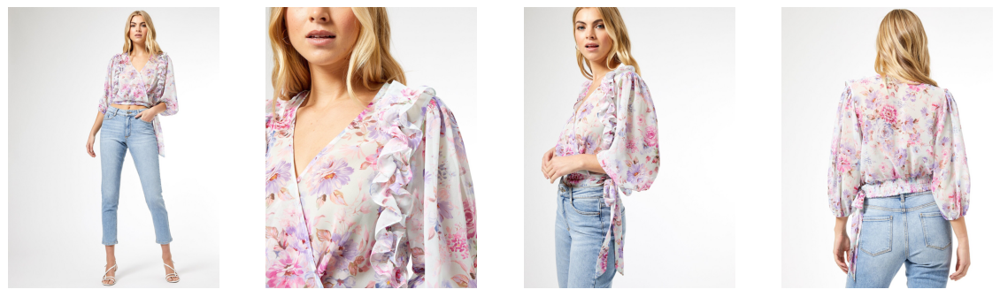

******************Query Image 1 to find lower body clothes************


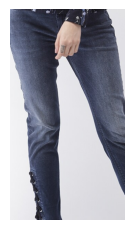

Time taken to do embedding of image  0:00:05.131405
Searching for images....... 
Time taken to search similar images  0:00:00.235750
recomendation 1
You can buy product from below link
https://www.myntra.com/jeans/scotch--soda/scotch--soda-women-blue-regular-fit-mid-rise-clean-look-jeans/8960907/buy


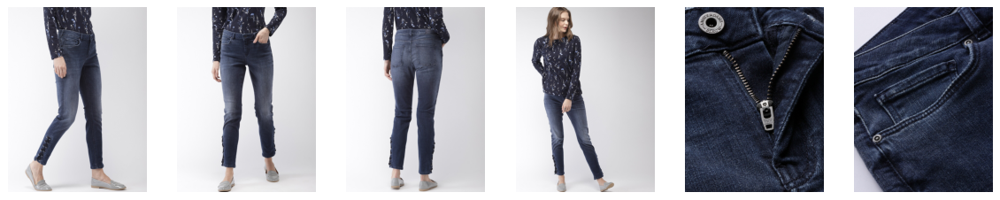

recomendation 2
You can buy product from below link
https://www.myntra.com/jeans/ovs/ovs-women-blue-slim-fit-mid-rise-clean-look-cropped-stretchable-jeans/7560666/buy


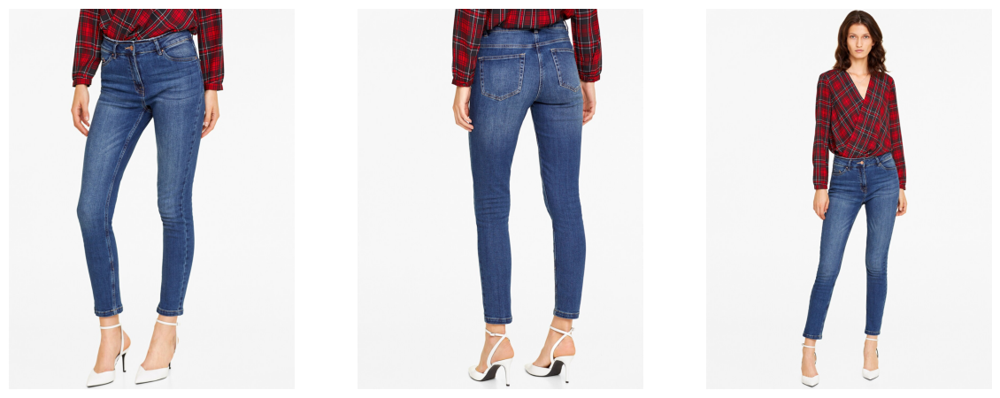

recomendation 3
You can buy product from below link
https://www.myntra.com/jeans/vero-moda/vero-moda-women-blue-bootcut-high-rise-clean-look-jeans/12414742/buy


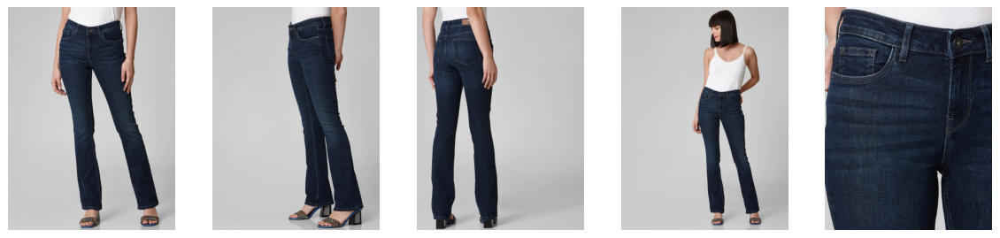

recomendation 4
You can buy product from below link
https://www.myntra.com/trousers/american-eagle-outfitters/american-eagle-outfitters-women-brown-solid-super-stretch-corduroy-regular-trousers/11696238/buy


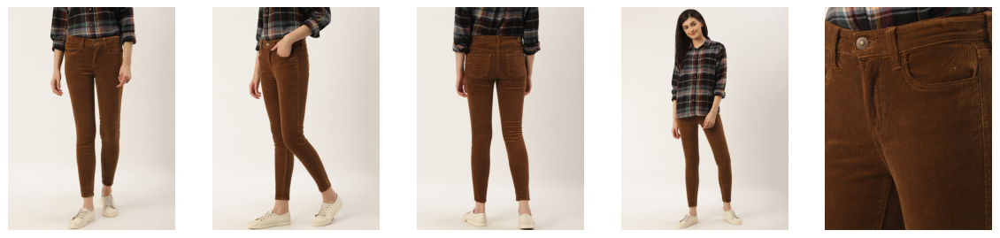

recomendation 5
You can buy product from below link
https://www.myntra.com/trousers/hm/hm-women-black-slim-fit-cargo-trousers/12427380/buy


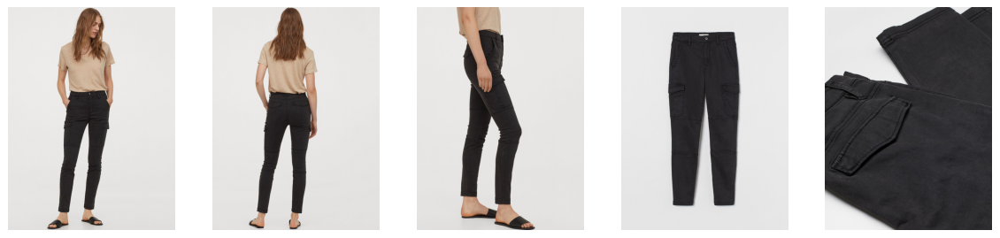

****************Query Image 1 to find lower body clothes********************


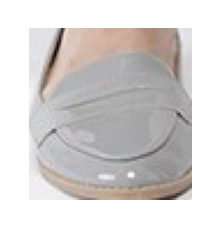

Time taken to do embedding of image  0:00:05.147261
Searching for images....... 
Time taken to search similar images  0:00:02.620020
recomendation 1
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/12087476/buy


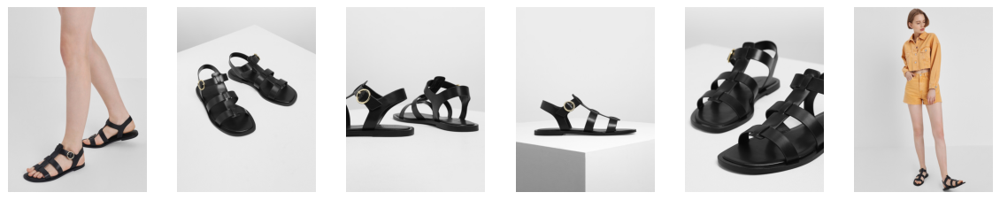

recomendation 2
You can buy product from below link
https://www.myntra.com/heels/charles--keith/charles--keith-women-yellow--black-animal-skin-textured-pumps/12087382/buy


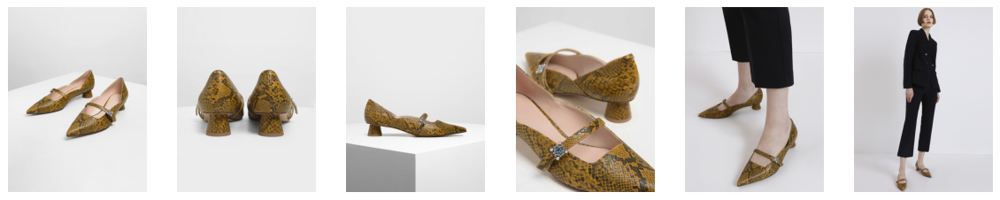

recomendation 3
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/11920388/buy


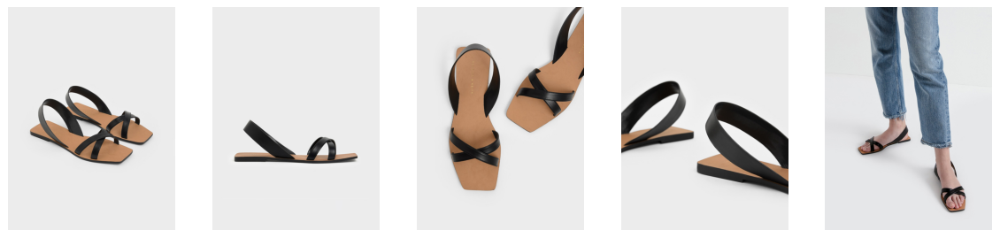

recomendation 4
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-off-white-solid-pu-mules/12087608/buy


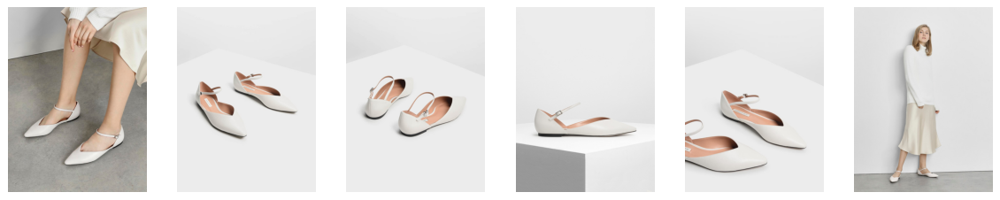

recomendation 5
You can buy product from below link
https://www.myntra.com/heels/truffle-collection/blue-boots/7936783/buy


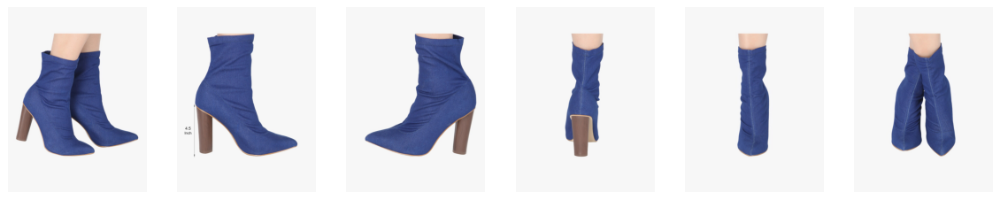

****************Query Image 1 to find lower body clothes********************


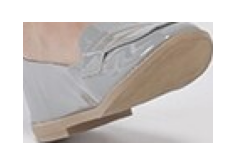

Time taken to do embedding of image  0:00:05.311927
Searching for images....... 
Time taken to search similar images  0:00:00.640487
recomendation 1
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/12087476/buy


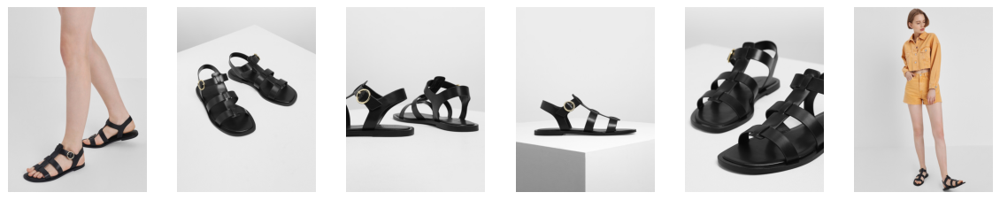

recomendation 2
You can buy product from below link
https://www.myntra.com/heels/charles--keith/charles--keith-women-yellow--black-animal-skin-textured-pumps/12087382/buy


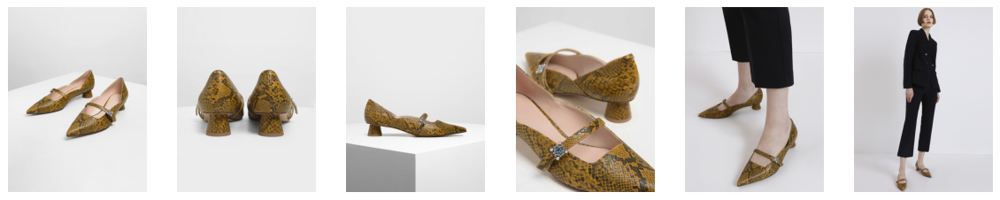

recomendation 3
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/11920388/buy


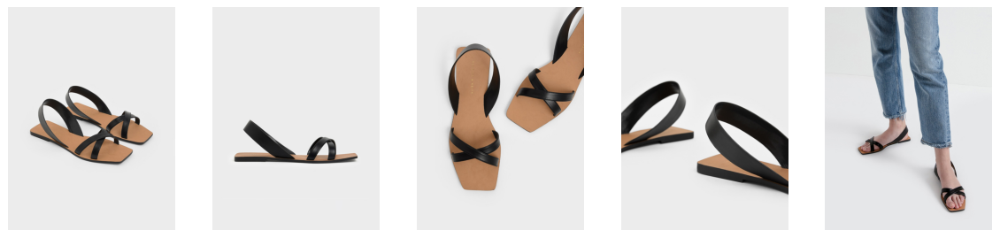

recomendation 4
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-off-white-solid-pu-mules/12087608/buy


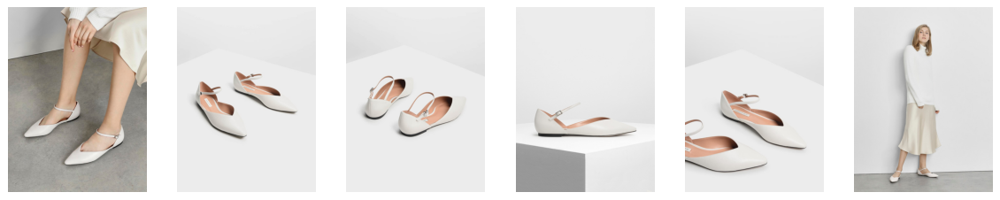

recomendation 5
You can buy product from below link
https://www.myntra.com/heels/truffle-collection/blue-boots/7936783/buy


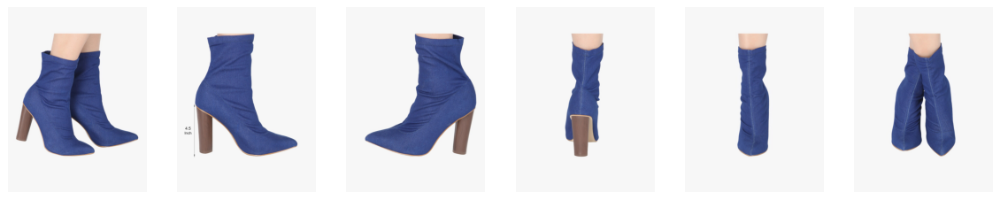

In [172]:
path = '/content/image3_3.jpg'
buy_me_that_look(path)

Searching for fashion objects...........
Time taken to locate all objects  0:00:07.454877
Below is the image with all detected fashion objects
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


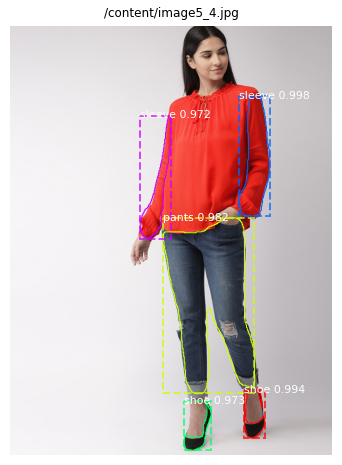

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
*********Query Image 1 to find upper body clothes****************


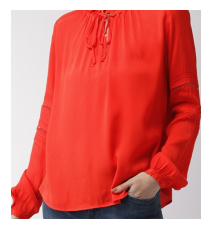

Time taken to do embedding of image  0:00:05.212589
Searching for images....... 
Time taken to search similar images  0:00:00.124699
recomendation 1
You can buy product from below link
https://www.myntra.com/tops/scotch--soda/scotch--soda-women-rust-red-solid-top/8532549/buy


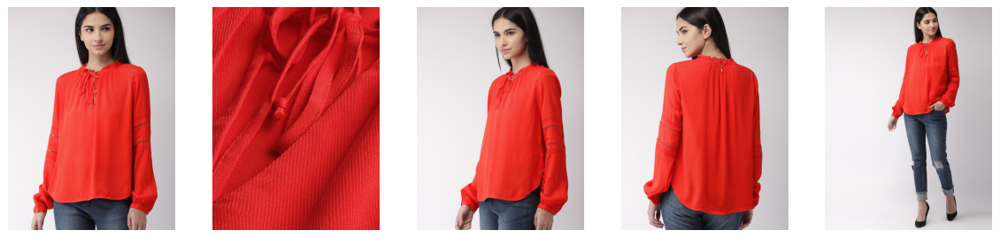

recomendation 2
You can buy product from below link
https://www.myntra.com/tops/forever-new/forever-new-women-pink-solid-bardot-top/10829932/buy


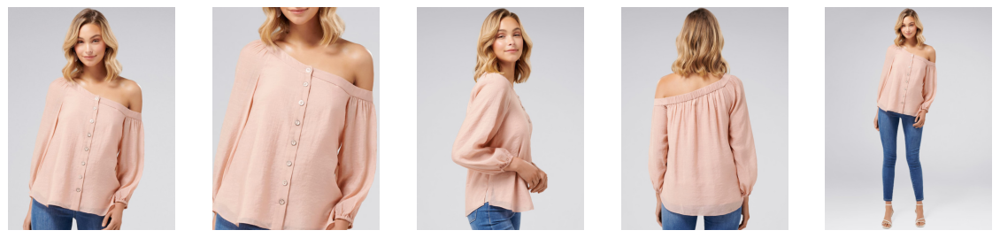

recomendation 3
You can buy product from below link
https://www.myntra.com/tops/pepe-jeans/pepe-jeans-women-mustard-yellow-self-design-top/2279350/buy


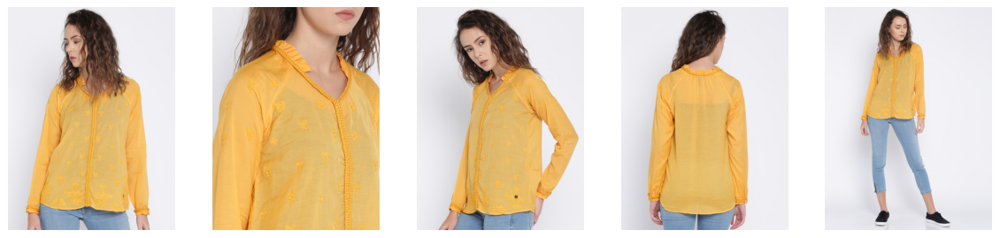

recomendation 4
You can buy product from below link
https://www.myntra.com/shirts/only/only-women-green-regular-fit-solid-casual-shirt/11685924/buy


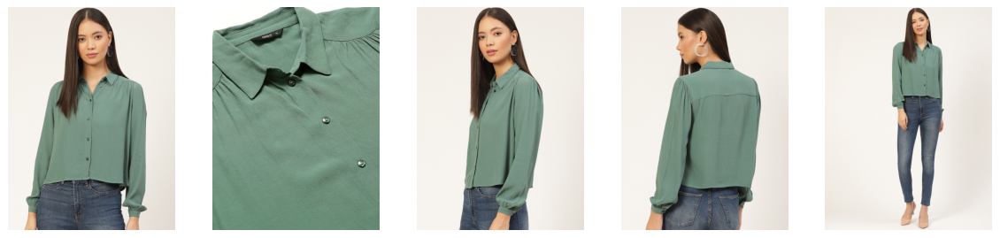

recomendation 5
You can buy product from below link
https://www.myntra.com/shirts/us-polo-assn-women/us-polo-assn-women-green-regular-fit-solid-casual-shirt/2276249/buy


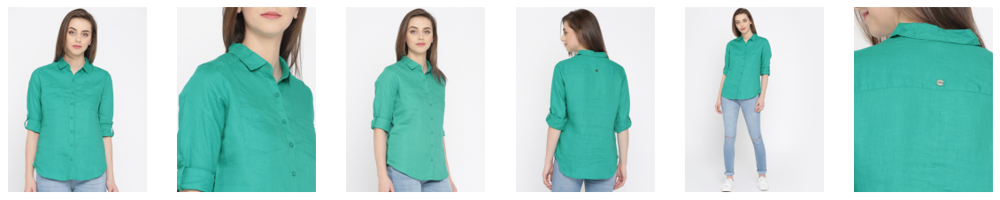

******************Query Image 1 to find lower body clothes************


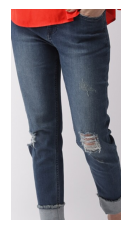

Time taken to do embedding of image  0:00:05.256307
Searching for images....... 
Time taken to search similar images  0:00:00.147022
recomendation 1
You can buy product from below link
https://www.myntra.com/jeans/vero-moda/vero-moda-women-blue-bootcut-high-rise-clean-look-jeans/12414742/buy


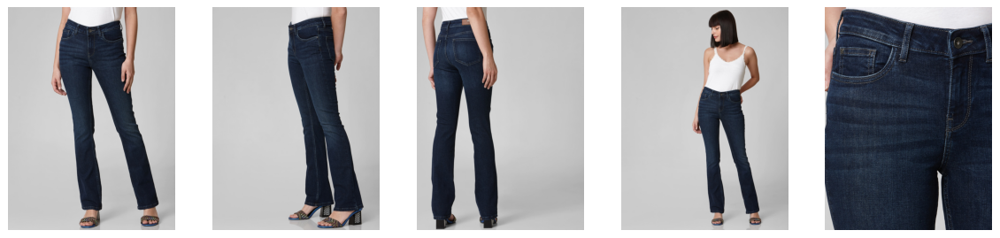

recomendation 2
You can buy product from below link
https://www.myntra.com/jeans/ovs/ovs-women-blue-slim-fit-mid-rise-clean-look-cropped-stretchable-jeans/7560666/buy


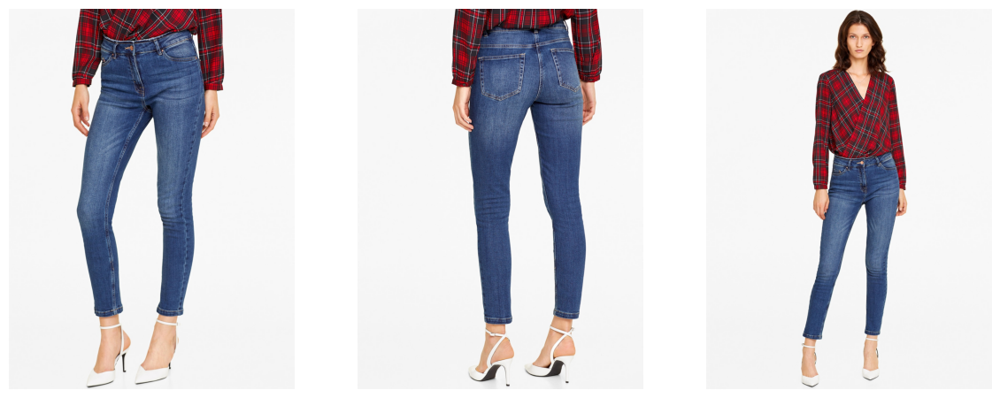

recomendation 3
You can buy product from below link
https://www.myntra.com/trousers/park-avenue/park-avenue-women-teal-slim-fit-solid-regular-trousers/7371823/buy


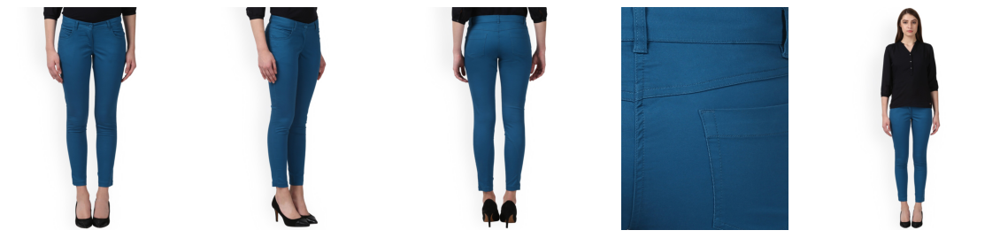

recomendation 4
You can buy product from below link
https://www.myntra.com/jeans/scotch--soda/scotch--soda-women-blue-skinny-fit-mid-rise-clean-look-stretchable-jeans/8651719/buy


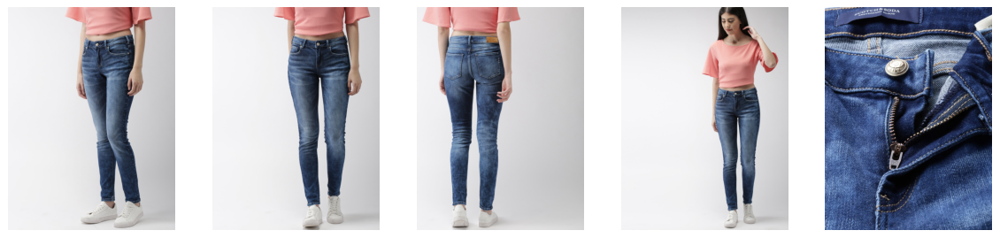

recomendation 5
You can buy product from below link
https://www.myntra.com/jeans/gas/gas-women-navy-blue-slim-fit-mid-rise-clean-look-stretchable-jeans/8276457/buy


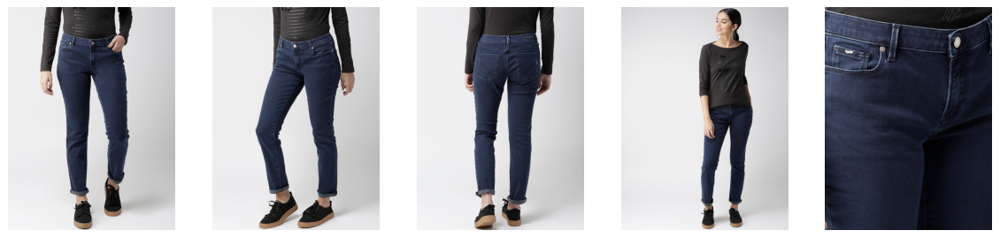

****************Query Image 1 to find lower body clothes********************


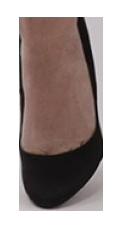

Time taken to do embedding of image  0:00:05.235450
Searching for images....... 
Time taken to search similar images  0:00:00.180193
recomendation 1
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/12087476/buy


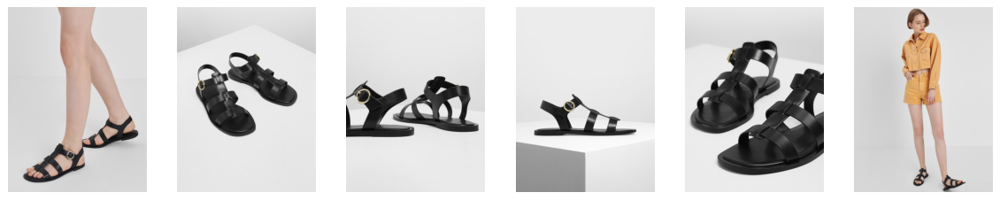

recomendation 2
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/11920388/buy


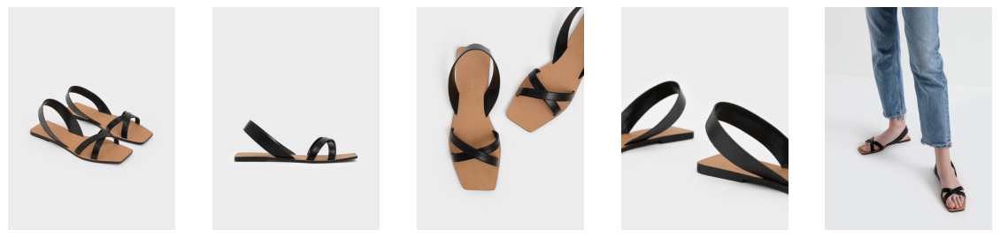

recomendation 3
You can buy product from below link
https://www.myntra.com/heels/truffle-collection/blue-boots/7936783/buy


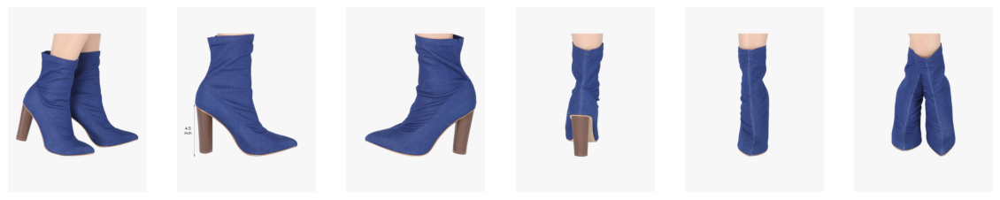

recomendation 4
You can buy product from below link
https://www.myntra.com/heels/charles--keith/charles--keith-women-brown-solid-pumps/12087406/buy


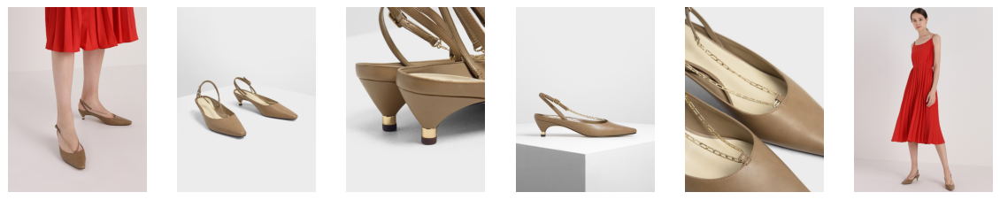

recomendation 5
You can buy product from below link
https://www.myntra.com/flats/birkenstock/birkenstock-women-black-solid-daloa-birko-flor-open-toe-flats/11219794/buy


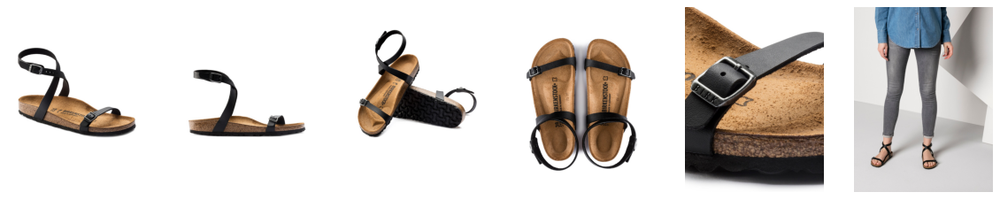

****************Query Image 1 to find lower body clothes********************


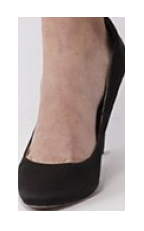

Time taken to do embedding of image  0:00:05.199877
Searching for images....... 
Time taken to search similar images  0:00:00.189507
recomendation 1
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/12087476/buy


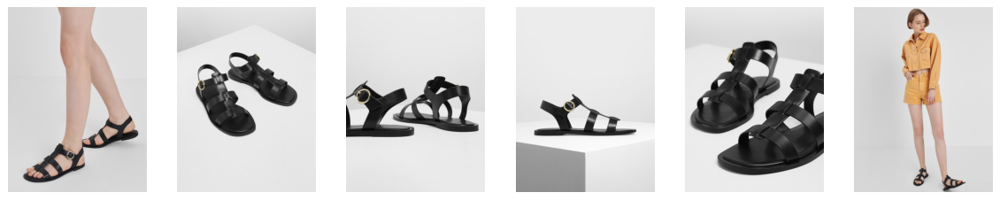

recomendation 2
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/11920388/buy


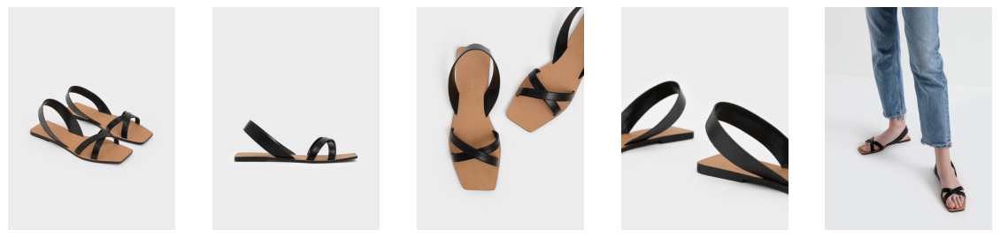

recomendation 3
You can buy product from below link
https://www.myntra.com/heels/truffle-collection/blue-boots/7936783/buy


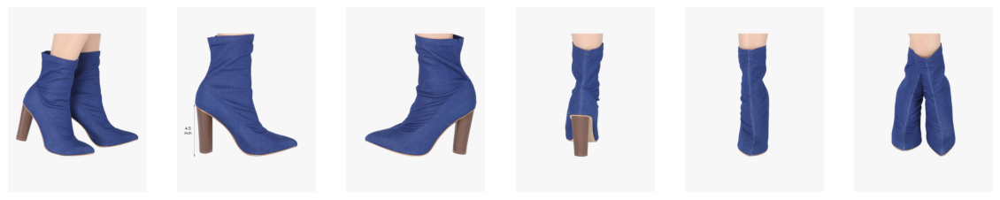

recomendation 4
You can buy product from below link
https://www.myntra.com/heels/charles--keith/charles--keith-women-brown-solid-pumps/12087406/buy


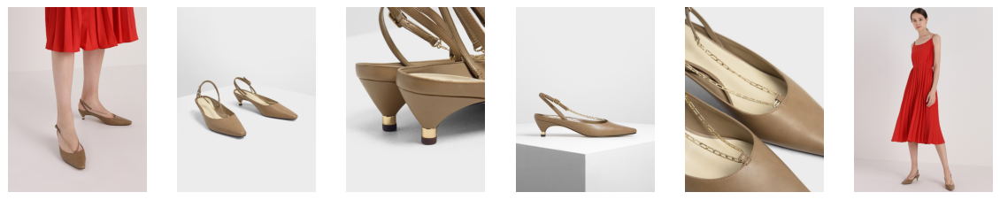

recomendation 5
You can buy product from below link
https://www.myntra.com/flats/birkenstock/birkenstock-women-black-solid-daloa-birko-flor-open-toe-flats/11219794/buy


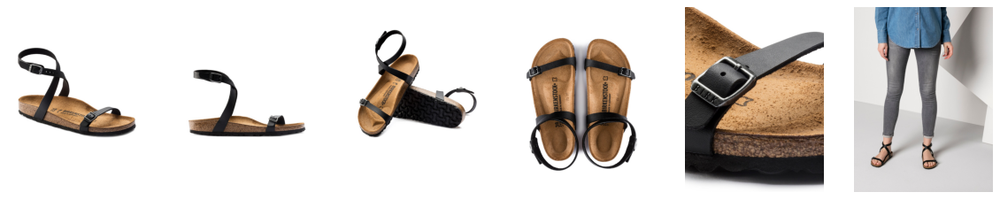

In [234]:
path = '/content/image5_4.jpg'
buy_me_that_look(path)

Searching for fashion objects...........
Time taken to locate all objects  0:00:07.456438
Below is the image with all detected fashion objects
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


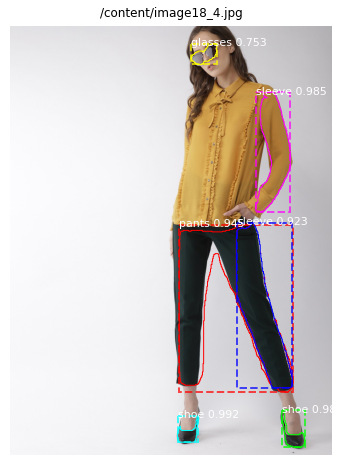

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
*********Query Image 1 to find upper body clothes****************


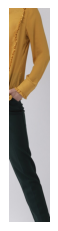

Time taken to do embedding of image  0:00:05.204362
Searching for images....... 
Time taken to search similar images  0:00:00.134359
recomendation 1
You can buy product from below link
https://www.myntra.com/shirts/scotch--soda/scotch--soda-women-mustard-yellow-regular-fit-solid-casual-shirt/8532621/buy


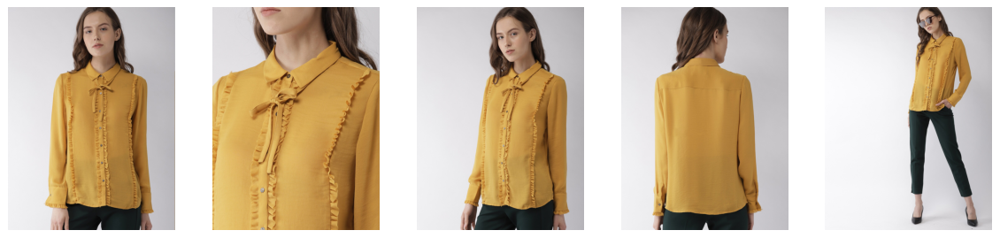

recomendation 2
You can buy product from below link
https://www.myntra.com/tops/forever-new/forever-new-women-pink-solid-bardot-top/10829932/buy


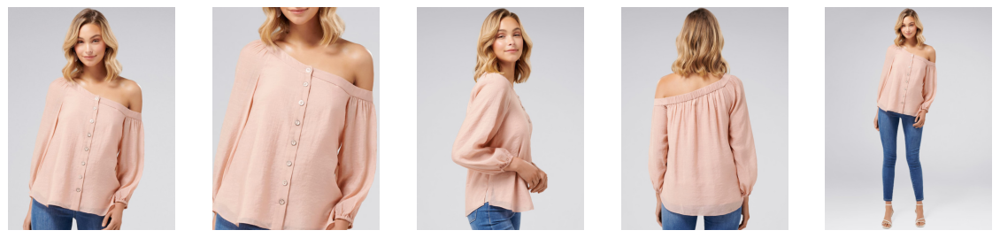

recomendation 3
You can buy product from below link
https://www.myntra.com/shirts/forever-new/forever-new-women-maroon-regular-fit-checked-casual-shirt/10904158/buy


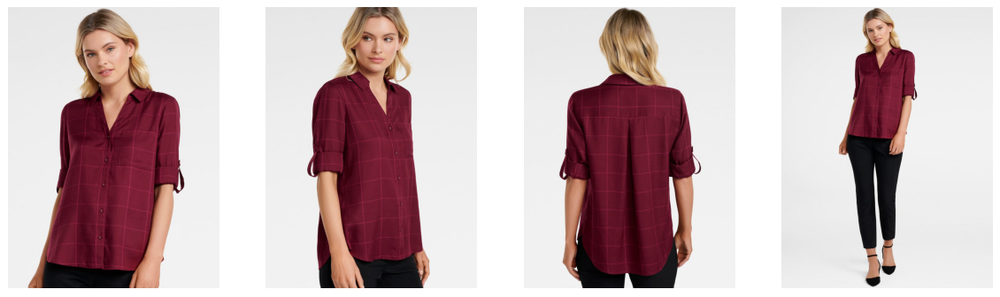

recomendation 4
You can buy product from below link
https://www.myntra.com/shirts/park-avenue-woman/park-avenue-woman-women-lavender-regular-fit-solid-formal-shirt/8590891/buy


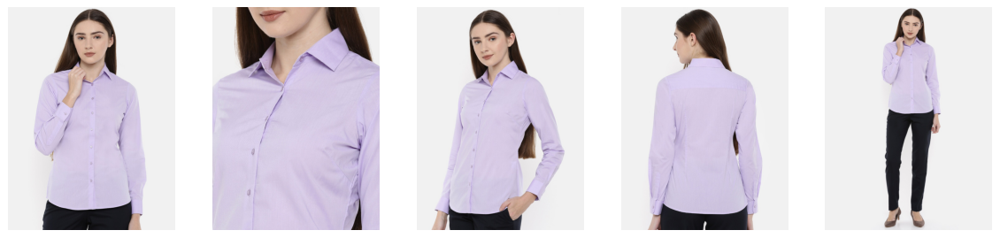

recomendation 5
You can buy product from below link
https://www.myntra.com/shirts/ovs/ovs-women-peach-coloured-regular-fit-semi-sheer-solid-casual-shirt/7560797/buy


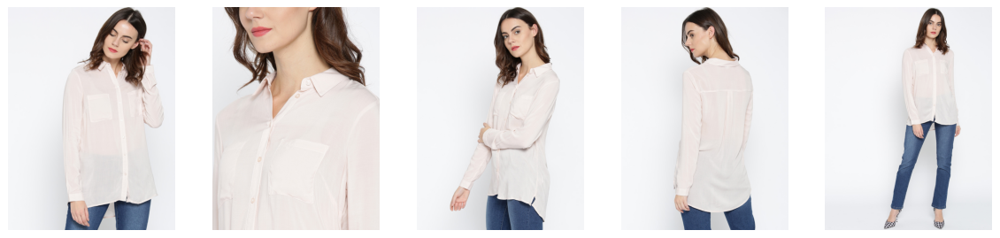

******************Query Image 1 to find lower body clothes************


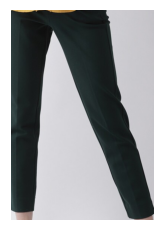

Time taken to do embedding of image  0:00:05.230091
Searching for images....... 
Time taken to search similar images  0:00:00.143412
recomendation 1
You can buy product from below link
https://www.myntra.com/jeans/vero-moda/vero-moda-women-blue-bootcut-high-rise-clean-look-jeans/12414742/buy


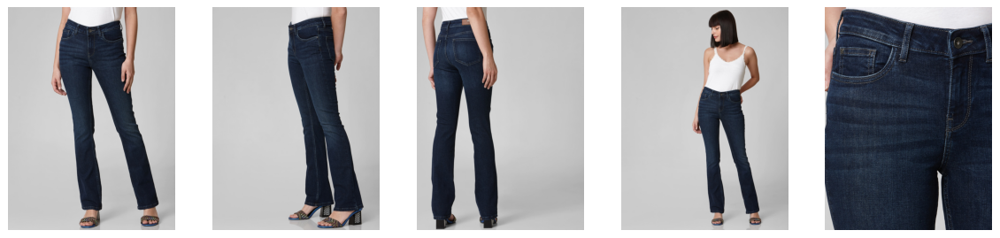

recomendation 2
You can buy product from below link
https://www.myntra.com/trousers/park-avenue-woman/park-avenue-black-striped-tapered-fit-formal-trousers/1669044/buy


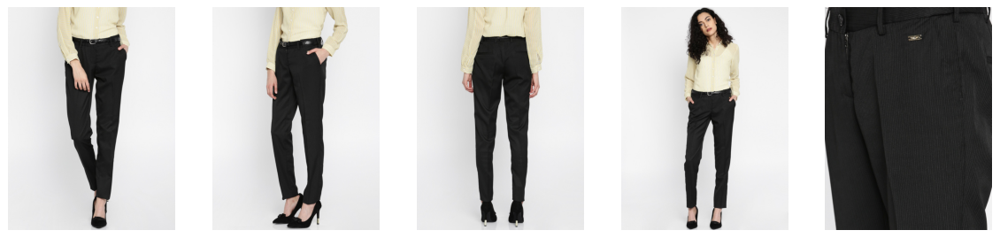

recomendation 3
You can buy product from below link
https://www.myntra.com/trousers/park-avenue/park-avenue-women-teal-slim-fit-solid-regular-trousers/7371823/buy


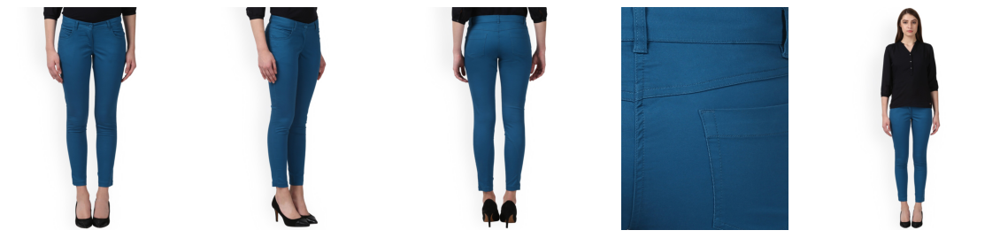

recomendation 4
You can buy product from below link
https://www.myntra.com/trousers/arrow-woman/arrow-woman-grey-original-regular-fit-solid-regular-trousers/2483825/buy


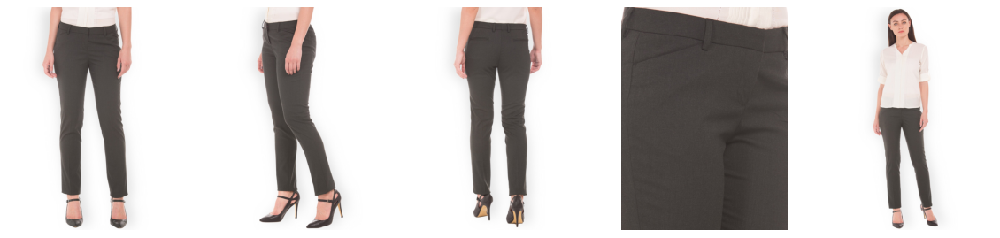

recomendation 5
You can buy product from below link
https://www.myntra.com/jeans/vero-moda/vero-moda-women-blue-skinny-fit-mid-rise-mildly-distressed-stretchable-jeans/12414768/buy


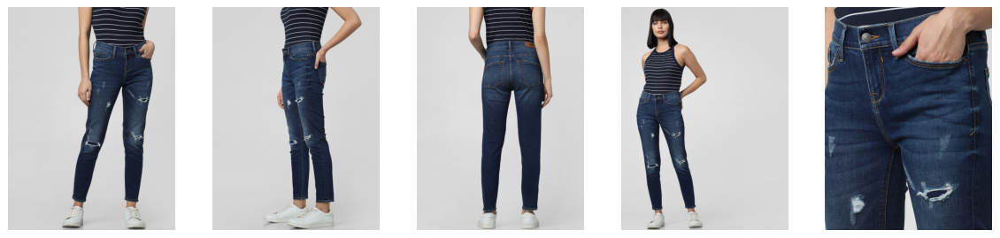

****************Query Image 1 to find lower body clothes********************


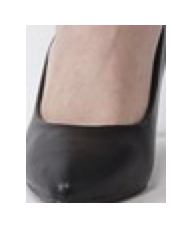

Time taken to do embedding of image  0:00:05.142868
Searching for images....... 
Time taken to search similar images  0:00:00.181688
recomendation 1
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/12087476/buy


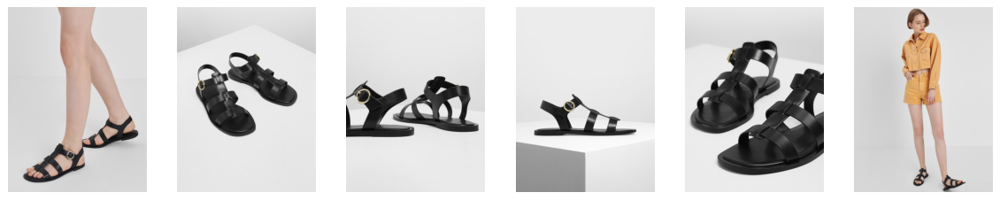

recomendation 2
You can buy product from below link
https://www.myntra.com/heels/charles--keith/charles--keith-women-yellow--black-animal-skin-textured-pumps/12087382/buy


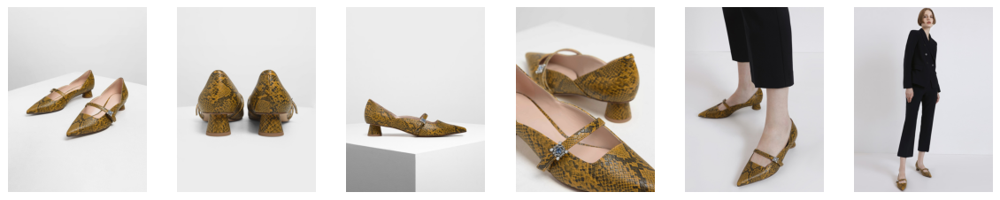

recomendation 3
You can buy product from below link
https://www.myntra.com/heels/truffle-collection/blue-boots/7936783/buy


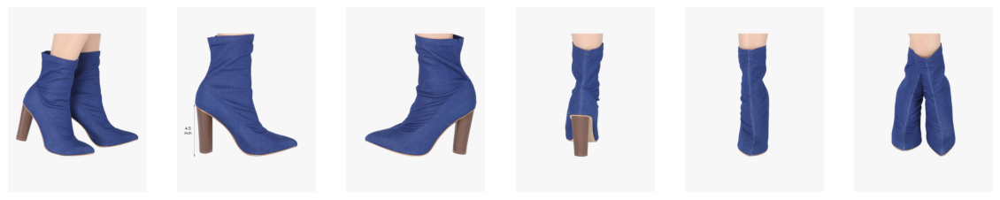

recomendation 4
You can buy product from below link
https://www.myntra.com/heels/charles--keith/charles--keith-women-brown-solid-pumps/12087406/buy


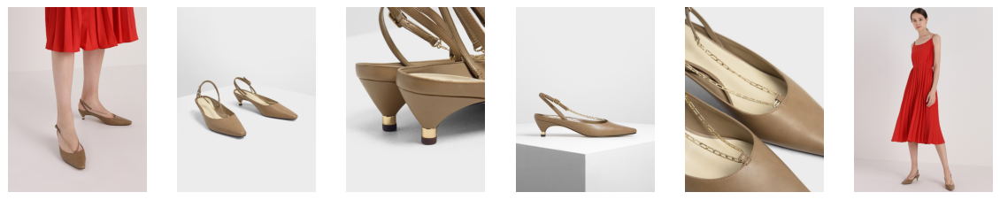

recomendation 5
You can buy product from below link
https://www.myntra.com/flats/birkenstock/birkenstock-women-black-solid-daloa-birko-flor-open-toe-flats/11219794/buy


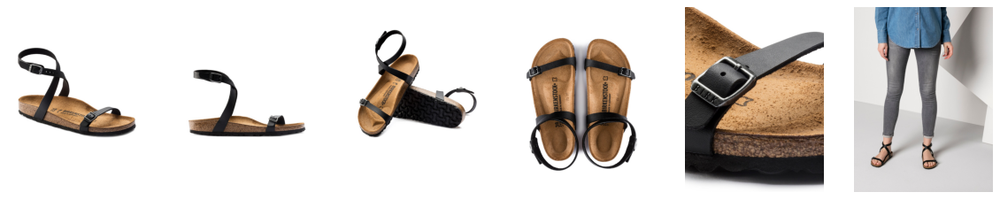

****************Query Image 1 to find lower body clothes********************


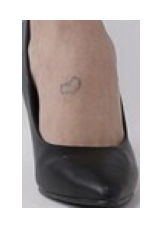

Time taken to do embedding of image  0:00:05.180277
Searching for images....... 
Time taken to search similar images  0:00:00.195747
recomendation 1
You can buy product from below link
https://www.myntra.com/flats/charles--keith/charles--keith-women-black-solid-open-toe-flats/12087476/buy


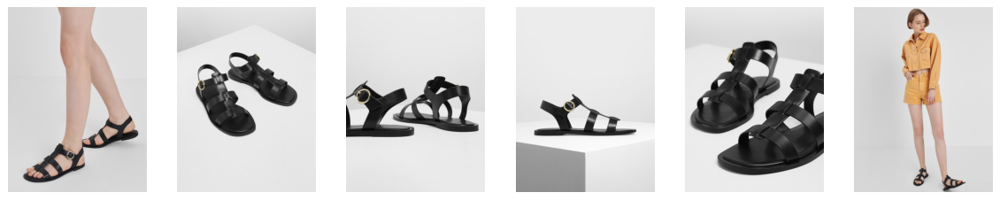

recomendation 2
You can buy product from below link
https://www.myntra.com/heels/charles--keith/charles--keith-women-yellow--black-animal-skin-textured-pumps/12087382/buy


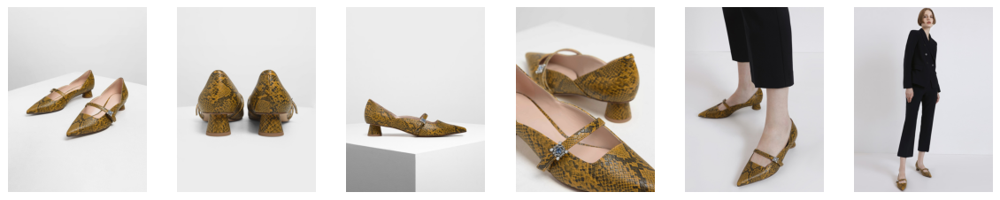

recomendation 3
You can buy product from below link
https://www.myntra.com/heels/truffle-collection/blue-boots/7936783/buy


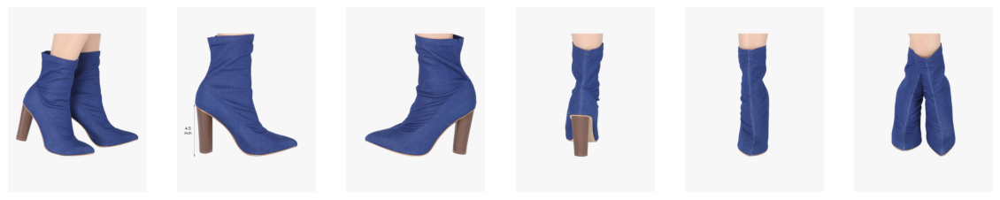

recomendation 4
You can buy product from below link
https://www.myntra.com/heels/charles--keith/charles--keith-women-brown-solid-pumps/12087406/buy


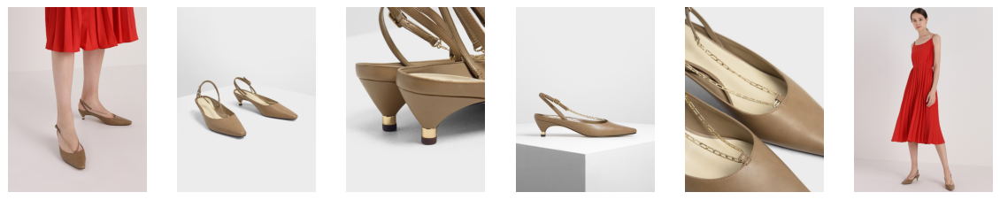

recomendation 5
You can buy product from below link
https://www.myntra.com/flats/birkenstock/birkenstock-women-black-solid-daloa-birko-flor-open-toe-flats/11219794/buy


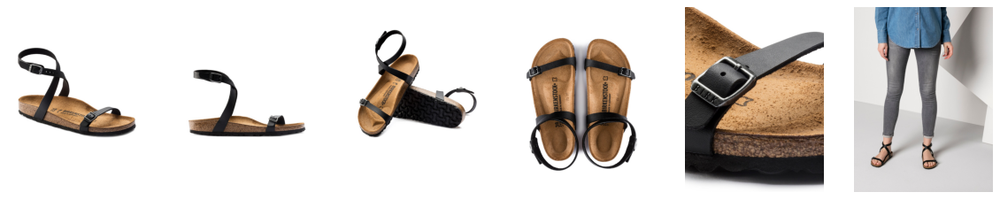

In [231]:
path = '/content/image18_4.jpg'
buy_me_that_look(path)

In [ ]:
"""
Observations: So we have good first cut solution. Model is able to detect and retrive fashion objects from given image.
So there are few wrong object detection and wrong retrival but this is because model is trained for less epochs. Some wrong
retrivals are beacuse whole images are embedded and not the objects. Also database size is also very small.
But over all we have a first cut solution which can be further expanded and optimized.

"""

In [ ]:
"""
Future Work:
1. Improve MAP by training models for more epochs.
2. Reduce the latency of end to end application.
3. For embeedings try diferent approaches.
4. Add more categories to object detection.
"""